In [4]:
import pycocotools.mask as mask_util
import numpy as np
count =  {"size": [480, 640], "counts": "Xca338N[>>N00FeAOgg3OPgL1O00001O1O4Mm0RO6J0000mNT1L4M3O00P]10PcN1O001O0000001N1O5L4WUW5"}
# string to integer
mask = mask_util.decode(count)
np.array(mask).shape

(480, 640)

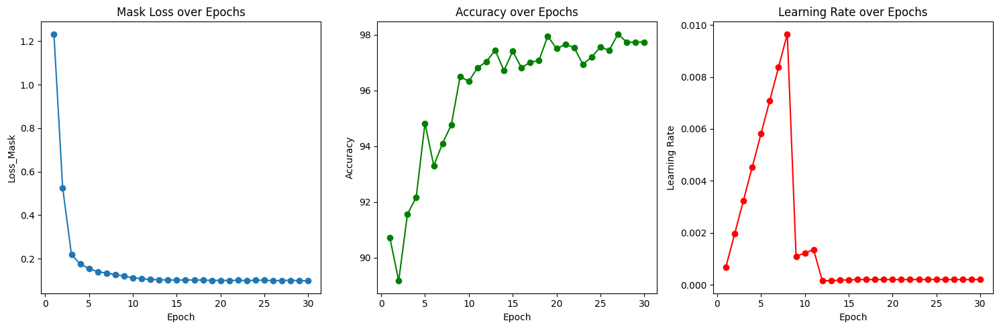

In [6]:
# Adjusting the parsing to handle two data points per epoch and plotting mid points
import numpy as np
import matplotlib.pyplot as plt
import json
# Reinitializing the lists for the new data processing
epochs = []
mid_losses = []
mid_accuracies = []
mid_learning_rates = []

# Variables to store intermediate values
losses_temp = []
accuracies_temp = []
learning_rates_temp = []
current_epoch = None
new_file_path = '/Users/david/Documents/thesis/Thesis_code/hr_thesis_dataset_evaluator_config_7c_ex/config_test_time/20240110_162812/vis_data/50epoch_train.json'
# Processing the file
with open(new_file_path, 'r') as file:
    for line in file:
        line_num = 0
        
        try:
            entry = json.loads(line)
            epoch = entry.get('epoch', 0)
            line_num += 1
            # Check if we've moved to a new epoch
            if current_epoch is not None and epoch != current_epoch:
                # Calculate and store the mid point values for the previous epoch
                mid_losses.append(np.mean(losses_temp))
                mid_accuracies.append(np.mean(accuracies_temp))
                mid_learning_rates.append(np.mean(learning_rates_temp))
                
                # Reset temporary lists
                losses_temp = []
                accuracies_temp = []
                learning_rates_temp = []

            # Update the current epoch and temporary lists
            current_epoch = epoch
            epochs.append(epoch)
            losses_temp.append(entry.get('loss_mask', 0))
            accuracies_temp.append(entry.get('acc', 0))
            learning_rates_temp.append(entry.get('lr', 0))
        except json.JSONDecodeError:
            continue

# Add the last set of mid points
if losses_temp and accuracies_temp and learning_rates_temp:
    mid_losses.append(np.mean(losses_temp))
    mid_accuracies.append(np.mean(accuracies_temp))
    mid_learning_rates.append(np.mean(learning_rates_temp))

# Creating the plots with the mid point dataset
plt.figure(figsize=(15, 5))
# pitch one for each five epochs
epochs = epochs[::6]
# choose range of visualization
max_epochs = 30
epochs = epochs[:max_epochs]
mid_losses = mid_losses[:max_epochs]
mid_accuracies = mid_accuracies[:max_epochs]
mid_learning_rates = mid_learning_rates[:max_epochs]
# Loss Plot
plt.subplot(1, 3, 1)
plt.plot(epochs[:len(mid_losses)], mid_losses, marker='o')
plt.xlabel('Epoch')
plt.ylabel('Loss_Mask')
plt.title('Mask Loss over Epochs')

# Accuracy Plot
plt.subplot(1, 3, 2)
plt.plot(epochs[:len(mid_accuracies)], mid_accuracies, marker='o', color='green')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Accuracy over Epochs')

# Learning Rate Plot
plt.subplot(1, 3, 3)
plt.plot(epochs[:len(mid_learning_rates)], mid_learning_rates, marker='o', color='red')
plt.xlabel('Epoch')
plt.ylabel('Learning Rate')
plt.title('Learning Rate over Epochs')

plt.tight_layout()
plt.show()


In [19]:
np.array(mid_losses).shape

(100,)

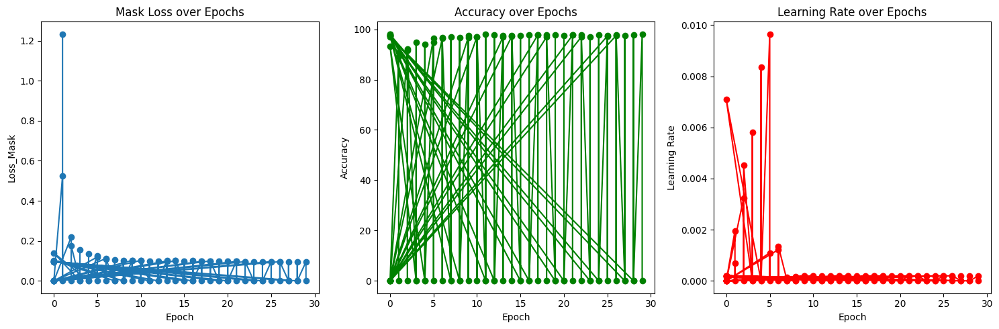

In [13]:
# Adjusting the parsing to handle two data points per epoch and plotting mid points
import numpy as np
import matplotlib.pyplot as plt
import json
# Reinitializing the lists for the new data processing
epochs = []
mid_losses = []
mid_accuracies = []
mid_learning_rates = []

# Variables to store intermediate values
losses_temp = []
accuracies_temp = []
learning_rates_temp = []
current_epoch = None
new_file_path = '/Users/david/Documents/thesis/Thesis_code/hr_thesis_dataset_evaluator_config_7c_ex/config_test_time/20240110_162812/vis_data/50epoch.json'
# Processing the file
with open(new_file_path, 'r') as file:
    for line in file:
        line_num = 0
        try:
            entry = json.loads(line)
            epoch = entry.get('epoch', 0)
            line_num += 1
            # Check if we've moved to a new epoch
            if current_epoch is not None and epoch != current_epoch:
                # Calculate and store the mid point values for the previous epoch
                mid_losses.append(np.mean(losses_temp))
                mid_accuracies.append(np.mean(accuracies_temp))
                mid_learning_rates.append(np.mean(learning_rates_temp))
                
                # Reset temporary lists
                losses_temp = []
                accuracies_temp = []
                learning_rates_temp = []

            # Update the current epoch and temporary lists
            current_epoch = epoch
            epochs.append(epoch)
            losses_temp.append(entry.get('loss_mask', 0))
            accuracies_temp.append(entry.get('acc', 0))
            learning_rates_temp.append(entry.get('lr', 0))
        except json.JSONDecodeError:
            continue

# Add the last set of mid points
if losses_temp and accuracies_temp and learning_rates_temp:
    mid_losses.append(np.mean(losses_temp))
    mid_accuracies.append(np.mean(accuracies_temp))
    mid_learning_rates.append(np.mean(learning_rates_temp))

# Creating the plots with the mid point dataset
plt.figure(figsize=(15, 5))
# odd elements of epochs are the mid points
epochs = epochs[::2]
# Loss Plot
plt.subplot(1, 3, 1)
plt.plot(epochs[:len(mid_losses)], mid_losses, marker='o')
plt.xlabel('Epoch')
plt.ylabel('Loss_Mask')
plt.title('Mask Loss over Epochs')

# Accuracy Plot
plt.subplot(1, 3, 2)
plt.plot(epochs[:len(mid_accuracies)], mid_accuracies, marker='o', color='green')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Accuracy over Epochs')

# Learning Rate Plot
plt.subplot(1, 3, 3)
plt.plot(epochs[:len(mid_learning_rates)], mid_learning_rates, marker='o', color='red')
plt.xlabel('Epoch')
plt.ylabel('Learning Rate')
plt.title('Learning Rate over Epochs')

plt.tight_layout()
plt.show()


In [57]:
np.array(epochs_json).shape

(500,)

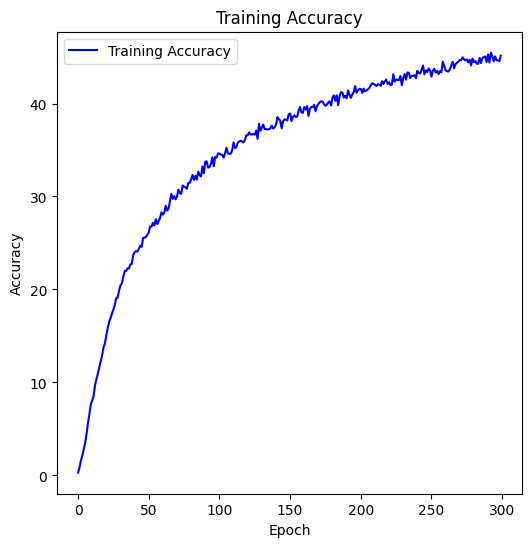

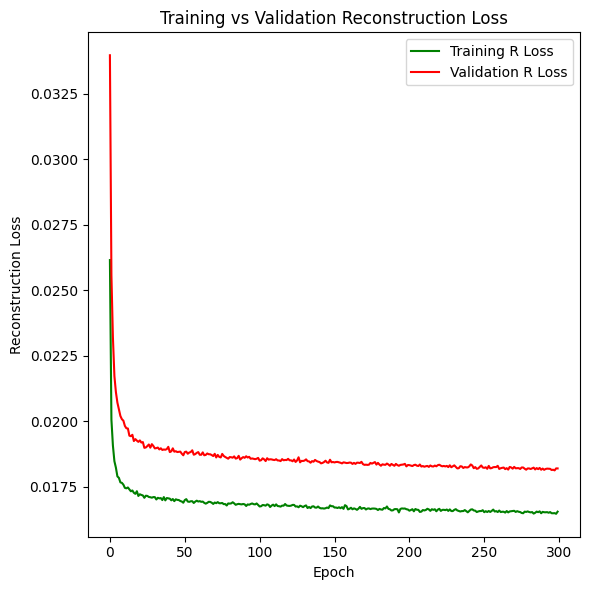

In [58]:
# Based on the keys and sample values, we can now extract the correct data for plotting.
# We'll plot the training accuracy and the R metric for both training and validation.
import json
import matplotlib.pyplot as plt
json_file_path = '/Users/david/Downloads/loss2.json'
json_data = json.load(open(json_file_path, 'r'))
# Extracting the relevant data
epochs_json = json_data['epoch']
train_accuracy_json = json_data['train_accuracy']
train_loss_r_json = json_data['train_loss_r']
test_loss_r_json = json_data['test_loss_r']

# Plotting the data from the JSON file
plt.figure(figsize=(6, 6))

# Plot 1: Training Accuracy from JSON Data
plt.plot(epochs_json[0:300], train_accuracy_json[0:300], label='Training Accuracy', color='blue')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training Accuracy')
plt.legend()

plt.figure(figsize=(6, 6))
# Plot 2: Training vs Validation R Metric (Loss R) from JSON Data
plt.plot(epochs_json[0:300], train_loss_r_json[0:300], label='Training R Loss', color='green')
plt.plot(epochs_json[0:300], test_loss_r_json[0:300], label='Validation R Loss', color='red')
plt.xlabel('Epoch')
plt.ylabel('Reconstruction Loss')
plt.title('Training vs Validation Reconstruction Loss')
plt.legend()

plt.tight_layout()
plt.show()


# Single image segmentation test

## Cluster to segment instance

In [2]:
import tensorflow as tf

In [5]:
import open3d as o3d
import numpy as np
import os



pcd1 = o3d.io.read_point_cloud('/Users/david/Documents/thesis/Thesis_code/data_collection/global_data/pcd_semantic_map/rgb_1701885985.7466576_0_0.pcd')
pcd2 = o3d.io.read_point_cloud('/Users/david/Documents/thesis/Thesis_code/data_collection/global_data/pcd_semantic_map/rgb_1701885985.7466576_1_0.pcd')
# # Define the minimum and maximum points for the axis-aligned bounding box
# min_bound = np.array([3, -6, 0])
# max_bound = np.array([5, 1, 2])

# # Create an axis-aligned bounding box
# bounding_box = o3d.geometry.AxisAlignedBoundingBox(min_bound, max_bound)

# # Crop the point cloud using the bounding box
# cropped_pcd = pcd.crop(bounding_box)
pcd = pcd1+ pcd2

#save the pcd_big_map
o3d.io.write_point_cloud('pcd_test.pcd',pcd)
#visualize the pcd_big_map in black background
#o3d.visualization.draw_geometries(pcd)


True

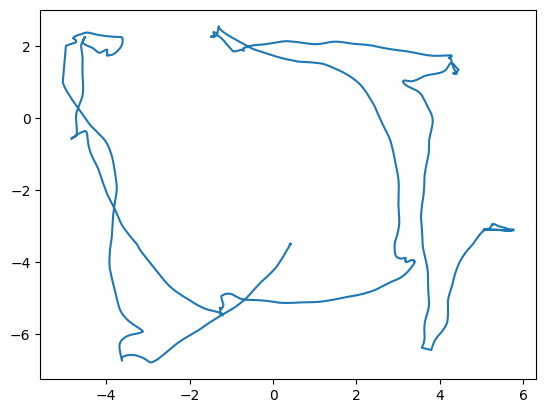

In [28]:
import pandas as pd
import matplotlib.pyplot as plt

path_train_position = '/Users/david/Documents/thesis/Thesis_code/data_collection/bag_all/fortrain/vrpn_client_node-HaoranDrone-pose.csv'
path_train_global = '/Users/david/Documents/thesis/Thesis_code/data_collection/bag_all/forGlobalmap2/vrpn_client_node-HaoranDrone-pose.csv'
path_test_position = '/Users/david/Documents/thesis/Thesis_code/data_collection/bag_all/fortesttest2/vrpn_client_node-HaoranDrone-pose.csv'
df_train = pd.read_csv(path_train_position)
df_global = pd.read_csv(path_train_global)
df_test = pd.read_csv(path_test_position)
#draw the 3d trajectory of the drone
plt.figure(figsize=(15, 5))
plt.subplot(1, 3, 1)
plt.plot(df_train['pose.position.x'],df_train['pose.position.y'])
plt.plot(df_global['pose.position.x'],df_global['pose.position.y'])

plt.plot(df_test['pose.position.x'],df_test['pose.position.y'])
#plt.plot(df_test['pose.position.x'],df_test['pose.position.y'])

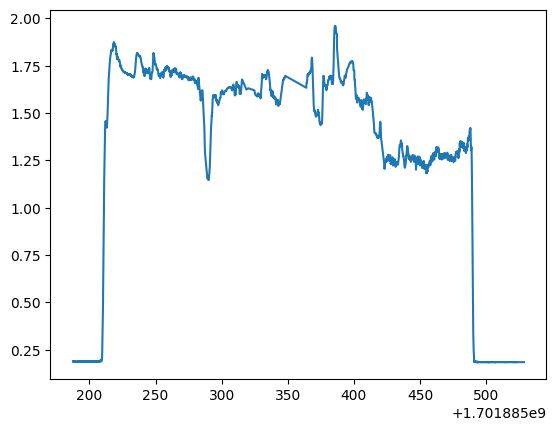

In [2]:
plt.plot(df_train['Time'],df_train['pose.position.z'])


In [21]:
df['Time']
def find_nearest_time_row(df, time_test):
    # Calculate the absolute difference
    df['TimeDifference'] = (df['Time'] - time_test).abs()
    # Find the index of the smallest difference
    closest_index = df['TimeDifference'].idxmin()
    # Get the row with the closest time
    closest_time_row = df.loc[closest_index]
    # If you want to drop the 'TimeDifference' column afterwards
    df = df.drop(columns=['TimeDifference'])
    return closest_time_row

0.5545969605445862

In [14]:
import numpy as np
import quaternion  # numpy-quaternion package
# Example camera position and orientation in the world frame
camera_position = np.array([cam_x, cam_y, cam_z])  # Replace with actual values
camera_orientation = np.quaternion(ori_x, ori_y, ori_z, ori_w)  # Replace with actual values

def cam_to_world(camera_position, camera_orientation, point_cloud):
    """
    Transforms a point cloud from the camera frame to the world frame
    :param camera_position: position of the camera in the world frame
    :param camera_orientation: orientation of the camera in the world frame
    :param point_cloud: point cloud in the camera frame
    :return: point cloud in the world frame
    """
    # Convert quaternion to rotation matrix
    rotation_matrix = quaternion.as_rotation_matrix(camera_orientation)

    # Function to transform a point from the camera frame to the world frame
    def transform_point(point, rotation_matrix, translation_vector):
        rotated_point = np.dot(rotation_matrix, point)
        transformed_point = rotated_point + translation_vector
        return transformed_point

    # Transforming each point in the point cloud
    transformed_point_cloud = np.array([transform_point(point, rotation_matrix, camera_position) for point in point_cloud])

    return transformed_point_cloud


In [14]:
import os
import json
path_global='/Users/david/Documents/thesis/Thesis_code/data_collection/data_collection/global_dataWed Dec  6 19:05:27 2023'

path_global_rgb = os.path.join(path_global, 'rgb')
path_global_depth = os.path.join(path_global, 'depth')
cam_pam_path = os.path.join(path_global, 'cam')
with open(os.path.join(cam_pam_path,'cam_params.json') , 'r') as file:
    cam_pam_mid = json.load(file)
data = json.loads(cam_pam_mid)

# Transform the structure
transformed_data = {
    "depth_intrin.width": int(data["depth_intrin.width"]),
    "depth_intrin.height": int(data["depth_intrin.height"]),
    "depth_intrin.fx": float(data["depth_intrin.fx"]),
    "depth_intrin.fy": float(data["depth_intrin.fy"]),
    "depth_intrin.ppx": float(data["depth_intrin.ppx"]),
    "depth_intrin.ppy": float(data["depth_intrin.ppy"]),
    "depth_scale": float(data["depth_scale"])
}
output_file = 'updated_camera_intrinsics.json'
output_path = os.path.join(cam_pam_path, output_file)

with open(output_path, 'w') as file:
    json.dump(transformed_data, file)


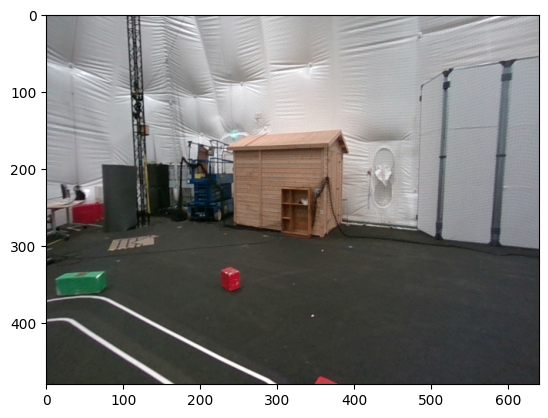

In [11]:
plt.imshow(rgb)

In [1]:
from segments_generator import read_segments, save_segments, get_pcd_from_rgbd, save_segments_as_csv2
from depth_intrinsics import DepthIntrinsics
import os
import open3d as o3d
import cv2
import numpy as np
import matplotlib.pyplot as plt
import json
import pycocotools.mask as mask_util
import numpy as np
import label_color_class

label_to_color = label_color_class.label_to_color

# load all segmentation files
path_global='/Users/david/Documents/thesis/Thesis_code/data_collection/train_data'

path_global_rgb = os.path.join(path_global, 'rgb')
path_global_depth = os.path.join(path_global, 'depth')
cam_pam_path = os.path.join(path_global, 'cam')
path_global_annotation = os.path.join(path_global, 'preds')
files = os.listdir(path_global_annotation)
files.sort()

test_num = 158

# load annotation file[0] to test the code
with open(os.path.join(path_global_annotation,files[test_num]), 'r') as file:
    annotation = json.load(file)

# find rgb and depth image with the same file name with annotation file without extension and after second '.'
timestamp = files[test_num].split('_')[1].split('.')[0]
file_name = files[test_num].split('.')[0] + '.' + files[test_num].split('.')[1].split('.')[0]
file_name_rgb = file_name + '.png'
file_name_depth = 'depth_' + file_name.split('_')[1] + '.png'
# load rgb and depth image
bgr = cv2.imread(os.path.join(path_global_rgb, file_name_rgb)) # bgr

rgb = cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB)
depth = cv2.imread(os.path.join(path_global_depth, file_name_depth), -1)

# load camera parameters
with open(os.path.join(cam_pam_path,'updated_camera_intrinsics.json') , 'r') as file:
    cam_pam = json.load(file)

depth_intrin = DepthIntrinsics()
depth_intrin.width = int(cam_pam['depth_intrin.width'])
depth_intrin.height = int(cam_pam['depth_intrin.height'])
depth_intrin.fx = float(cam_pam['depth_intrin.fx'])
depth_intrin.fy = float(cam_pam['depth_intrin.fy'])
depth_intrin.ppx = float(cam_pam['depth_intrin.ppx'])
depth_intrin.ppy = float(cam_pam['depth_intrin.ppy'])
depth_scale = float(cam_pam['depth_scale'])

mask_rgb = np.zeros_like(rgb)
segments_rgb_list = []
segments_label_list = []
segments_score_list = []
segments_pcd_list = []

masks = annotation['masks']
bboxes = annotation['bboxes']
labels = annotation['labels']
scores = annotation['scores']

for mask, label, score in zip(masks, labels, scores):

    if score < 0.5: # threshold to filter out low-confidence instances
        continue
    color = label_to_color.get(label)
    mask_decode = mask_util.decode(mask)
    mask_rgb[mask_decode > 0] = color
    segment_rgb = np.zeros_like(rgb)  
    segment_rgb[mask_decode > 0] = color
    segment_pcd = get_pcd_from_rgbd(segment_rgb, depth, depth_intrin, depth_scale, filter_black_points=True)
    # continue when the pcd is not empty
    if segment_pcd.is_empty():
        continue
    segments_pcd_list.append(segment_pcd)
    segments_rgb_list.append(segment_rgb)
    segments_label_list.append(label)
    segments_score_list.append(score)

# save segments as csv file
save_segments_as_csv2(segments_pcd_list, timestamp)


In [4]:
viewer = o3d.visualization.Visualizer()
viewer.create_window()
for geometry in segments_pcd_list:
    viewer.add_geometry(geometry)
opt = viewer.get_render_option()
opt.show_coordinate_frame = True
opt.background_color = np.asarray([0.5, 0.5, 0.5])
viewer.run()
viewer.destroy_window()

[Open3D WARNING] GLFW Error: Cocoa: Failed to find service port for display
[Open3D WARNING] GLFW Error: Cocoa: Failed to find service port for display


[Open3D WARNING] GLFW Error: Cocoa: Failed to find service port for display
[Open3D WARNING] GLFW Error: Cocoa: Failed to find service port for display
[Open3D WARNING] GLFW Error: Cocoa: Failed to find service port for display
[Open3D WARNING] GLFW Error: Cocoa: Failed to find service port for display


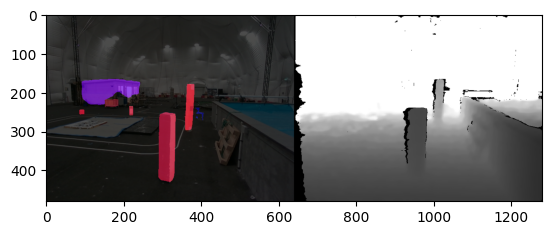

In [2]:
# create pcd from rgb and depth image
pcd = get_pcd_from_rgbd(rgb, depth, depth_intrin, depth_scale, filter_black_points=True)

# load w,h, fx, fy, cx, cy

# Create an Open3D window for real-time visualization
vis = o3d.visualization.Visualizer()
vis.create_window('Segments', width=640, height=480)

#o3d.visualization.draw_geometries([downpcd])
vis.clear_geometries()
for segment in segments_pcd_list:
    vis.add_geometry(segment)
    vis.poll_events()
    vis.update_renderer()

# Convert depth image to 8-bit grayscale
depth_image_8bit = cv2.convertScaleAbs(depth, alpha=0.03)
# Convert grayscale image to 3-channel RGB image
depth_image_rgb = cv2.cvtColor(depth_image_8bit, cv2.COLOR_GRAY2RGB)

# Blend mask with original image
alpha = 0.3
blended_image = cv2.addWeighted(rgb, alpha, mask_rgb, 1 - alpha, 0)
concatenated_image = np.hstack((blended_image, depth_image_rgb))
plt.imshow(concatenated_image)
cv2.imshow("Color and Depth Images", concatenated_image)
# downsample
#pcd = pcd.voxel_down_sample(voxel_size=0.08)

In [59]:
scores

[0.9902472496032715,
 0.9875816106796265,
 0.973818302154541,
 0.9730773568153381,
 0.9233828186988831,
 0.7620691061019897,
 0.6736728549003601,
 0.21213176846504211,
 0.14875949919223785,
 0.10705017298460007,
 0.06808184087276459,
 0.059753790497779846,
 0.05396164581179619]

In [3]:
o3d.visualization.draw_geometries(segments_pcd_list)

In [54]:
import os
import cv2
from tqdm import tqdm

# load all segmentation files
path_global='/Users/david/Documents/thesis/Thesis_code/data_collection/data_collection/global_dataWed Dec  6 19:05:27 2023'

path_global_depth = os.path.join(path_global, 'depth')
files = os.listdir(path_global_depth)
files.sort()
# end with .png
for file in tqdm(files):
    if file.endswith('.png'):
        depth = cv2.imread(os.path.join(path_global_depth, file), -1)
        resized = cv2.resize(depth, (640, 480),  interpolation = cv2.INTER_AREA)
        # create folder for resized depth
        path_global_depth_resized = os.path.join(path_global, 'depth_resized')
        if not os.path.exists(path_global_depth_resized):
            os.makedirs(path_global_depth_resized)
        cv2.imwrite(os.path.join(path_global_depth_resized, file), resized)

100%|██████████| 359/359 [00:08<00:00, 43.07it/s]


In [ ]:
iter = 0
for file in files:
    if file.endswith('.json'):

# Visulization of single segment but in the list
o3d.visualization.draw_geometries([segments[2]])
# Extract the masks and bounding boxes from pred_instances
masks = pred_instances.masks.cpu().numpy()
bboxes = pred_instances.bboxes.cpu().numpy()
labels = pred_instances.labels.cpu().numpy()
scores = pred_instances.scores.cpu().numpy()
mask_rgb = np.zeros_like(color_image)
segments_rgb_list = []

for mask, label, score in zip(masks, labels, scores):
    if score < 0.4: # threshold to filter out low-confidence instances
        continue
    color = label_to_color.get(label, (0, 0, 0))  # Default to black if label is not found
    mask_rgb[mask > 0] = color
    segments_rgb = np.zeros_like(color_image)    
    segments_rgb[mask > 0] = color
    segments_rgb_list.append(segments_rgb)

#rgbd_image = o3d.geometry.create_rgbd_image_from_color_and_depth(color_image, depth_image)
depth_scale = pipeline.get_active_profile().get_device().first_depth_sensor().get_depth_scale()
#depth_trunc = pipeline.get_active_profile().get_device().first_depth_sensor().get_option(rs.option.depth_units)
depth_intrin = depth_frame.profile.as_video_stream_profile().intrinsics
#print("depth_intrin:"+str(depth_intrin))


# create segments point cloud
segments_pcd_list = []
for segment_rgb in segments_rgb_list:
    segment_pcd = get_pcd_from_rgbd(segment_rgb, depth_image, depth_intrin, depth_scale)
    segments_pcd_list.append(segment_pcd)

# save segments
save_segments(segments_pcd_list, depth_frame.get_timestamp()/1000, labels, depth_intrin, depth_scale, scores)

In [1]:
import torch, torchvision
import mmdet
from mmdet.apis import init_detector,inference_detector
from mmdet.registry import VISUALIZERS
import mmcv
from mmcv.ops import get_compiling_cuda_version, get_compiler_version
from matplotlib import pyplot as plt
import numpy as np
import cv2

print('torch.__version__ and CUDA: ',torch.__version__, torch.cuda.is_available())
print('mmdet.__version__: ',mmdet.__version__)
print('get_compiling_cuda_version: ',get_compiling_cuda_version())
print('get_compiler_version: ',get_compiler_version())

# Choose to use a config and initialize the detector
config = '/Users/david/Documents/thesis/Thesis_code/model_2d/config.py'
#config = 'rtmdet-ins_s_8xb32-300e_coco.py'
# Setup a checkpoint file to load
checkpoint = '/Users/david/Documents/thesis/Thesis_code/model_2d/epoch_1_split.pth'
#checkpoint = 'pre_trained_models/rtmdet-ins_s_8xb32-300e_coco_20221121_212604-fdc5d7ec.pth'

# Load pretrained model
model = init_detector(config,checkpoint=checkpoint, device='cpu')
#path = '/Users/david/Documents/haoranDrone/train/rgb_1701885208.5500174.png'
#image = mmcv.imread(path)  
# or img = mmcv.imread(img), which will only load it once
#result = inference_detector(model, image)

torch.__version__ and CUDA:  2.1.1 False
mmdet.__version__:  3.2.0
get_compiling_cuda_version:  not available
get_compiler_version:  clang 13.0.0
Loads checkpoint by local backend from path: /Users/david/Documents/thesis/Thesis_code/model_2d/epoch_1_split.pth


In [2]:
pred_instances = result.pred_instances
masks = pred_instances.masks.cpu().numpy()
# Extract the masks and bounding boxes from pred_instances
masks = pred_instances.masks.cpu().numpy()
bboxes = pred_instances.bboxes.cpu().numpy()
labels = pred_instances.labels.cpu().numpy()
scores = pred_instances.scores.cpu().numpy()
mask_rgb = np.zeros_like(image)
segments_rgb_list = []
# Get the colormap
colors = model.dataset_meta['palette']
label_to_color = {label: colors[label] for label in range(len(colors))}

for mask, label, score in zip(masks, labels, scores):
    if score < 0.4: # threshold to filter out low-confidence instances
        continue
    color = label_to_color.get(label, (0, 0, 0))  # Default to black if label is not found
    mask_rgb[mask > 0] = color
    segments_rgb = np.zeros_like(image)    
    segments_rgb[mask > 0] = color
    segments_rgb_list.append(segments_rgb)

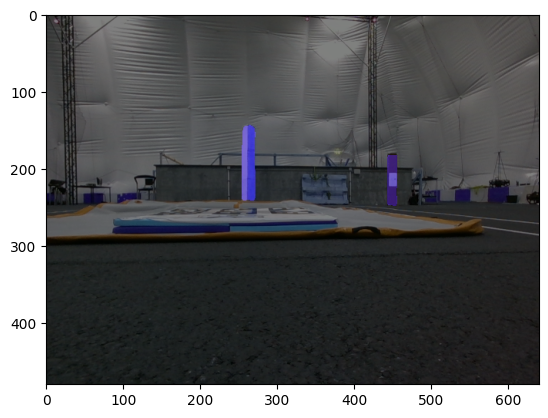

In [3]:
# Blend mask with original image
alpha = 0.5
mask_bgr = cv2.cvtColor(mask_rgb, cv2.COLOR_RGB2BGR)
blended_image = cv2.addWeighted(image, alpha, mask_bgr, 1 - alpha, 0)
plt.imshow(blended_image)
#cv2.imshow("Color Images", blended_image)

In [2]:
from mmcv.transforms import Compose

# Build test pipeline
model.cfg.test_dataloader.dataset.pipeline[0].type = 'LoadImageFromNDArray'
test_pipeline = Compose(model.cfg.test_dataloader.dataset.pipeline)
# init the visualizer(execute this block only once)
visualizer = VISUALIZERS.build(model.cfg.visualizer)
# the dataset_meta is loaded from the checkpoint and
# then pass to the model in init_detector
visualizer.dataset_meta = model.dataset_meta

# update visulizer with new image

# read all images from folder
import os
path = '/Users/david/Documents/haoranDrone/train/'
files = os.listdir(path)
files.sort()
cv2.namedWindow('result', 0)
iter = 0
for file in files:
    if file.endswith('.png'):
        # pass every 3 frames
        if iter % 3 == 0:
            # read image
            frame = mmcv.imread(path + file)
            result = inference_detector(model, frame)
            # show the results
            visualizer.add_datasample(
                'result',
                image=frame,
                data_sample=result,
                draw_gt=False,
                wait_time=0,
                # output file = original file name + '_result.png'

                #out_file='outputs/' + file[:-4] + '_result.png',
                show = False
            )
            frame_out = visualizer.get_image()
            # read image
            # image2 = cv2.imread('outputs/result_test_final.png')
            # set 30 hz frame rate
            #cv2.waitKey(33)
            #cv2.imshow("Images", frame_out)
            mmcv.imshow(frame_out, 'result', 1)
        iter += 1
            
            #o3d.io.write_point_cloud(str(d_time) + '.pcd', downpcd, write_ascii=False, compressed=False, print_progress=False)
        # Exit loop if 'q' key is pressed
cv2.destroyAllWindows()


/Users/david/opt/anaconda3/envs/openmmlab/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:196: UserWarning: Failed to add <class 'mmengine.visualization.vis_backend.LocalVisBackend'>, please provide the `save_dir` argument.
  warnings.warn(f'Failed to add {vis_backend.__class__}, '


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/david/opt/anaconda3/envs/openmmlab/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(
/Users/david/opt/anaconda3/envs/openmmlab/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(


KeyboardInterrupt: 

In [12]:
import torch

model = torch.load('/Users/david/Documents/thesis/Thesis_code/rtmdet-ins_tiny_8xb32-300e_coco_20221130_151727-ec670f7e.pth')

In [128]:
import pandas as pd
start_p = 35500
end_p = -5000
path = '/Users/david/Documents/thesis/Thesis_code/data_collection/imu_data/log_320_2023-12-6-19-09-12_sensor_combined_0.csv'
df = pd.read_csv(path)
accel_array = np.array([df['accelerometer_m_s2[0]'], df['accelerometer_m_s2[1]'], df['accelerometer_m_s2[2]']]).reshape(3, -1).T
gyro_array = np.array([df['gyro_rad[0]'], df['gyro_rad[1]'], df['gyro_rad[2]']]).reshape(3, -1).T
accel_array = accel_array[start_p:end_p,:]
gyro_array = gyro_array[start_p:end_p,:]
timestamp_array = np.array(df['timestamp'][start_p:end_p])
# transpose the accel_array


positions, orientations = calculate_trajectory(timestamp_array, gyro_array, accel_array, np.array([5.702338, -3.123139, 1.018846]), np.array([-0.046899129606665674,0.003063006563523716,1.8713806365154946]))
index = np.where(df['accelerometer_m_s2[2]'] < -16)
print(df['timestamp'][index[0]])
index2 = np.where(acceleration[:,1] < -13)
print(index2[0])
print(timestamp[index2[0]])
time_cam = timestamp[index2[0][0]]- timestamp[index2[0][-1]]
print(time_cam)
time_df = (df['timestamp'][index[0][0]] - df['timestamp'][index[0][1]])/1e6
print(time_df)
# print the timestamp of picked index and index2
print(df['timestamp'][index[0][0]])
print(df['timestamp'][index[0][1]])
print(timestamp[index2[0][0]])
print(timestamp[index2[0][-1]])
compensation = - df['timestamp'][index[0][0]]/1e6 + timestamp[index2[0][0]]
print(compensation)

# add compensation to timestamp and create new csv
df['timestamp'] = df['timestamp']/1e6 + compensation
# keep picked index rows
df = df.iloc[index[0][0]:index[0][1],:]
df.to_csv('imu_compensated.csv', index=False)

36861    3234239512
64884    3374221330
71822    3408876977
71823    3408881972
71824    3408886967
72248    3411004861
Name: timestamp, dtype: int64
[ 394  398 2405 3821 4286]
[1.70188680e+09 1.70188680e+09 1.70188687e+09 1.70188692e+09
 1.70188694e+09]
-139.96203541755676
-139.981818
3234239512
3374221330
1701886800.5190535
1701886940.4810889
1701883566.2795415


In [54]:
def rotation_matrix_from_degrees(roll, pitch, yaw):
    """
    Create a rotation matrix from roll, pitch, and yaw in degrees
    """
    # roll is rotation around x in degrees (counterclockwise)
    # pitch is rotation around y in degrees (counterclockwise)
    # yaw is rotation around z in degrees (counterclockwise)
    R_x = np.array([[1, 0, 0],
                    [0, math.cos(math.radians(roll)), -math.sin(math.radians(roll))],
                    [0, math.sin(math.radians(roll)), math.cos(math.radians(roll))]])
    R_y = np.array([[math.cos(math.radians(pitch)), 0, math.sin(math.radians(pitch))],
                    [0, 1, 0],
                    [-math.sin(math.radians(pitch)), 0, math.cos(math.radians(pitch))]])
    R_z = np.array([[math.cos(math.radians(yaw)), -math.sin(math.radians(yaw)), 0],
                    [math.sin(math.radians(yaw)), math.cos(math.radians(yaw)), 0],
                    [0, 0, 1]])
    rot = R_z.dot(R_y.dot(R_x))
    return rot
rot_33 = rotation_matrix_from_degrees(180, 0, -90)
rot_22 = rotation_matrix_from_degrees(0, 0, 30).dot(rot_33)
rot_11 = rotation_matrix_from_degrees(30, 0, 0).dot(rot_22)
rot_11

array([[ 5.00000000e-01, -8.66025404e-01, -1.06057524e-16],
       [-7.50000000e-01, -4.33012702e-01,  5.00000000e-01],
       [-4.33012702e-01, -2.50000000e-01, -8.66025404e-01]])

In [44]:
import numpy as np
rot_imu_to_drone = np.array([[ 0,  -1, 0],
                            [1,  0,  0],
                            [0,  0,  -1]]) #[0,180,90]

# Calculate the angle values
roll = np.arctan2(rot_imu_to_drone[2, 1], rot_imu_to_drone[2, 2])
pitch = np.arctan2(-rot_imu_to_drone[2, 0], np.sqrt(rot_imu_to_drone[2, 1]**2 + rot_imu_to_drone[2, 2]**2))
yaw = np.arctan2(rot_imu_to_drone[1, 0], rot_imu_to_drone[0, 0])

# Update the state with the calculated angles
print('roll: ', roll)
print('pitch: ', pitch)
print('yaw: ', yaw)

roll:  3.141592653589793
pitch:  0.0
yaw:  1.5707963267948966


(200, 3)
1701886803.5129128
1701886803.5162666
[ 5.75321722 -3.09106326  1.02256835]


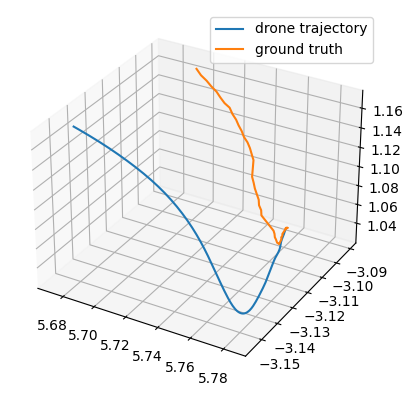

In [2]:
from matplotlib import pyplot as plt
import pandas as pd
import numpy as np

def calculate_trajectory(time_array, gyro_array, accel_array, initial_position, initial_orientation):
    """
    Calculate the trajectory (position and orientation) based on arrays of IMU data.

    :param time_array: Array of timestamps in microseconds
    :param gyro_array: Array of gyroscope readings [x, y, z] in rad/s
    :param accel_array: Array of accelerometer readings [x, y, z] in m/s^2
    :param initial_position: Initial position as a numpy array [x, y, z] in meters
    :param initial_orientation: Initial orientation as a numpy array [roll, pitch, yaw] in radians
    :return: Array of positions and orientations
    """
    # add bias to accel 0.28478655780245 -0.024718655019298263 -9.828971270850001
    gyro_bias = np.array([0.0020178240054855253, 0.0017592206368581425, 0.0017427009552286577])
    acc_bias = np.array([0.28478655780245, -0.024718655019298263, -9.828971270850001])
    # set bias to 0
    # gyro_bias = np.array([0, 0, 0])
    # acc_bias = np.array([0, 0, 0])
    num_data_points = len(time_array)
    positions = np.zeros((num_data_points, 3))
    orientations = np.zeros((num_data_points, 3))
    velocity = np.zeros((num_data_points, 3))

    positions[0] = initial_position
    
    orientations[0] = initial_orientation
    velocity[0] = np.array([0, 0, 0])

    for i in range(1, num_data_points):
        dt = (time_array[i] - time_array[i-1])  # Delta time in seconds
        # Define the rotation matrix for a minus 90-degree rotation around the Z-axis
        R_z = np.array([[0, 1, 0],
                        [1, 0, 0],
                        [0, 0, 1]])
        
        rot_to_drone = rotation_matrix_from_degrees(180, 0, -90)
        # Update Orientation using Gyroscope Data
        gyro = gyro_array[i] - gyro_bias
        rot_0 = rotation_matrix_from_rad(orientations[i-1][0], orientations[i-1][1], orientations[i-1][2])
        gyro = rot_to_drone.dot(gyro)
        gyro = rot_0.dot(gyro)
        orientation = gyro * dt
        #orientation = rot_to_drone.dot(orientation)
        #orientation = rot_0.dot(orientation)
        orientations[i] = orientations[i-1] + orientation
        
        # Update Position using Accelerometer Data
        # Assuming initial velocity is zero for simplicity
        rot = rotation_matrix_from_rad(orientations[i][0], orientations[i][1], orientations[i][2])

        accel = accel_array[i] - acc_bias
        # accel = R_z.dot(accel)
        # accel = rot.dot(accel)
        accel = rot_to_drone.dot(accel)
        accel = rot.dot(accel)
        velocity[i] = velocity[i-1] + accel * dt
        translations = velocity[i-1] * dt + 0.5 * accel * dt**2
        # Add bias to translation
        #bias_vector = np.array([0, 0, -0.03])
        #bias_vector = rot.dot(bias_vector)
        translations = translations #+ bias_vector
        #translations = R_z.dot(translations)
        #translations = rot_to_drone.dot(translations)
        #translations = rot.dot(translations)
        #positions[i] = positions[i-1] + velocity[i] * dt
        positions[i] = positions[i-1] + translations

    return positions, orientations
#import quaternion
import math
def rotation_matrix_from_degrees(roll, pitch, yaw):
    """
    Create a rotation matrix from roll, pitch, and yaw in degrees
    """
    # roll is rotation around x in degrees (counterclockwise)
    # pitch is rotation around y in degrees (counterclockwise)
    # yaw is rotation around z in degrees (counterclockwise)
    R_x = np.array([[1, 0, 0],
                    [0, math.cos(math.radians(roll)), -math.sin(math.radians(roll))],
                    [0, math.sin(math.radians(roll)), math.cos(math.radians(roll))]])
    R_y = np.array([[math.cos(math.radians(pitch)), 0, math.sin(math.radians(pitch))],
                    [0, 1, 0],
                    [-math.sin(math.radians(pitch)), 0, math.cos(math.radians(pitch))]])
    R_z = np.array([[math.cos(math.radians(yaw)), -math.sin(math.radians(yaw)), 0],
                    [math.sin(math.radians(yaw)), math.cos(math.radians(yaw)), 0],
                    [0, 0, 1]])
    rot = R_z.dot(R_y.dot(R_x))
    return rot

def rotation_matrix_from_rad(roll, pitch, yaw):
    """
    Create a rotation matrix from roll, pitch, and yaw in radians
    """
    # roll is rotation around x in radians (counterclockwise)
    # pitch is rotation around y in radians (counterclockwise)
    # yaw is rotation around z in radians (counterclockwise)
    R_x = np.array([[1, 0, 0],
                    [0, math.cos(roll), -math.sin(roll)],
                    [0, math.sin(roll), math.cos(roll)]])
    R_y = np.array([[math.cos(pitch), 0, math.sin(pitch)],
                    [0, 1, 0],
                    [-math.sin(pitch), 0, math.cos(pitch)]])
    R_z = np.array([[math.cos(yaw), -math.sin(yaw), 0],
                    [math.sin(yaw), math.cos(yaw), 0],
                    [0, 0, 1]])
    rot = R_z.dot(R_y.dot(R_x))
    return rot

def euler_from_quaternion(w, x, y, z):
        """
        Convert a quaternion into euler angles (roll, pitch, yaw)
        roll is rotation around x in radians (counterclockwise)
        pitch is rotation around y in radians (counterclockwise)
        yaw is rotation around z in radians (counterclockwise)
        """
        t0 = +2.0 * (w * x + y * z)
        t1 = +1.0 - 2.0 * (x * x + y * y)
        roll_x = math.atan2(t0, t1)
     
        t2 = +2.0 * (w * y - z * x)
        t2 = +1.0 if t2 > +1.0 else t2
        t2 = -1.0 if t2 < -1.0 else t2
        pitch_y = math.asin(t2)
     
        t3 = +2.0 * (w * z + x * y)
        t4 = +1.0 - 2.0 * (y * y + z * z)
        yaw_z = math.atan2(t3, t4)
     
        return roll_x, pitch_y, yaw_z


path_test_position = '/Users/david/Documents/thesis/Thesis_code/data_collection/bag_all/fortesttest2/vrpn_client_node-HaoranDrone-pose.csv'
path = '/Users/david/Documents/thesis/Thesis_code/data_collection/data_imu/imu_compensated.csv'
df_gt= pd.read_csv(path_test_position)
df_imu2 = pd.read_csv(path)
# imu start from row 68 and reset index
num = 200
start = 600
df = df_imu2.iloc[start:start+num,:].reset_index(drop=True)
accel_array = np.array([df['accelerometer_m_s2[0]'], df['accelerometer_m_s2[1]'], df['accelerometer_m_s2[2]']]).reshape(3, -1).T
gyro_array = np.array([df['gyro_rad[0]'], df['gyro_rad[1]'], df['gyro_rad[2]']]).reshape(3, -1).T
print(gyro_array.shape)
# find nearest timestamp for df_imu['timestamp'][0] in df_gt['Time']

# Calculate the absolute difference
df_gt['TimeDifference'] = (df_gt['Time'] - df['timestamp'][0]).abs()
# Find the index of the smallest difference
closest_index = df_gt['TimeDifference'].idxmin()
# Delete the TimeDifference column
df_gt = df_gt.drop(columns=['TimeDifference'])
# Get the row with the closest time
closest_time_row = df_gt.loc[closest_index]
# get the initial position and orientation
initial_position = np.array([closest_time_row['pose.position.x'], closest_time_row['pose.position.y'], closest_time_row['pose.position.z']])
#initial_orientation = np.quaternion(closest_time_row['pose.orientation.w'], closest_time_row['pose.orientation.x'], closest_time_row['pose.orientation.y'], closest_time_row['pose.orientation.z'])
# get the initial orientation in euler angle
orientation_x, orientation_y, orientation_z = euler_from_quaternion(closest_time_row['pose.orientation.w'], closest_time_row['pose.orientation.x'], closest_time_row['pose.orientation.y'], closest_time_row['pose.orientation.z'])
initial_orientation = np.array([orientation_x, orientation_y, orientation_z])

# delete column before ckosest_time_row
df_gt = df_gt.iloc[closest_index:,:].reset_index(drop=True)
print(df_gt['Time'][0])
print(df['timestamp'][0])
# Calculate the absolute difference of last timestamp
df_gt['TimeDifference'] = (df_gt['Time'] - df['timestamp'][len(df)-1]).abs()
# Find the index of the smallest difference
closest_index = df_gt['TimeDifference'].idxmin()
# Delete the TimeDifference column
df_gt = df_gt.drop(columns=['TimeDifference'])
# delete column after ckosest_time_row
df_gt = df_gt.iloc[:closest_index,:].reset_index(drop=True)

# calculate the trajectory
#print(df_imu['timestamp'])
positions, orientations = calculate_trajectory(df['timestamp'], gyro_array, accel_array, initial_position, initial_orientation)
# convert quaternion to euler angle
euler_angles = []
# plt.figure(figsize=(20,10))
# plt.subplot(2,1,1)
# plt.plot(positions[:,1], positions[:,2])
# # plot 2 in the same row
# plt.subplot(2,1,2)
# plt.plot(df_gt['pose.position.y'],df_gt['pose.position.z'])
#plt.plot(positions[:,0], positions[:,1])
# plot the ground truth
#plt.plot(df_gt['pose.position.x'],df_gt['pose.position.y'])
print(initial_position)
#plot 3d trajectory
from mpl_toolkits.mpalot3d import Axes3D
#fig = plt.figure(figsize=(20,10))
fig = plt.figure()
# plot in 3 plots and in 3d

ax = fig.add_subplot(111, projection='3d')  # Recommended way to set 3D projection
#ax = fig.gca(projection='3d')
ax.plot(positions[:,0], positions[:,1], positions[:,2], label='drone trajectory')
ax.plot(df_gt['pose.position.x'],df_gt['pose.position.y'],df_gt['pose.position.z'], label='ground truth')
ax.legend()

[ 5.1681304  -3.09342384  1.48162031]


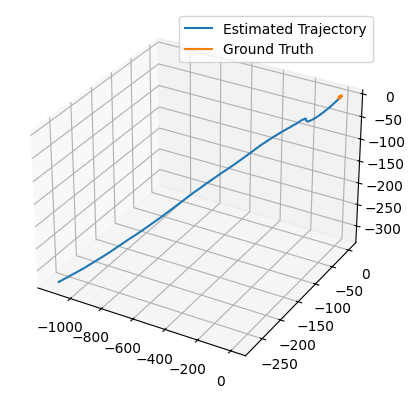

In [133]:
# show the trajectory and ground truth in different color
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')  # Recommended way to set 3D projection
ax.plot(positions[:,0], positions[:,1], positions[:,2], label='Estimated Trajectory')
ax.plot(df_gt['pose.position.x'],df_gt['pose.position.y'],df_gt['pose.position.z'], label='Ground Truth')
ax.legend()
plt.show()


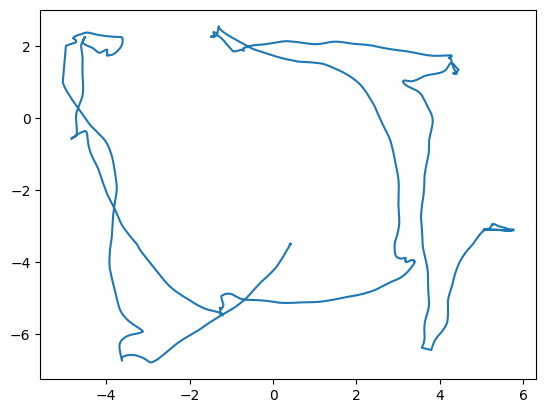

In [54]:
import pandas as pd
import matplotlib.pyplot as plt

path_train_position = '/Users/david/Documents/thesis/Thesis_code/data_collection/bag_all/fortrain/vrpn_client_node-HaoranDrone-pose.csv'
path_train_global = '/Users/david/Documents/thesis/Thesis_code/data_collection/bag_all/forGlobalmap2/vrpn_client_node-HaoranDrone-pose.csv'
path_test_position = '/Users/david/Documents/thesis/Thesis_code/data_collection/bag_all/fortesttest2/vrpn_client_node-HaoranDrone-pose.csv'
df_train = pd.read_csv(path_train_position)
df_global = pd.read_csv(path_train_global)
df_test = pd.read_csv(path_test_position)
plt.plot(df_test['pose.position.x'],df_test['pose.position.y'])
#plt.plot(df_test['pose.position.x'],df_test['pose.position.y'])

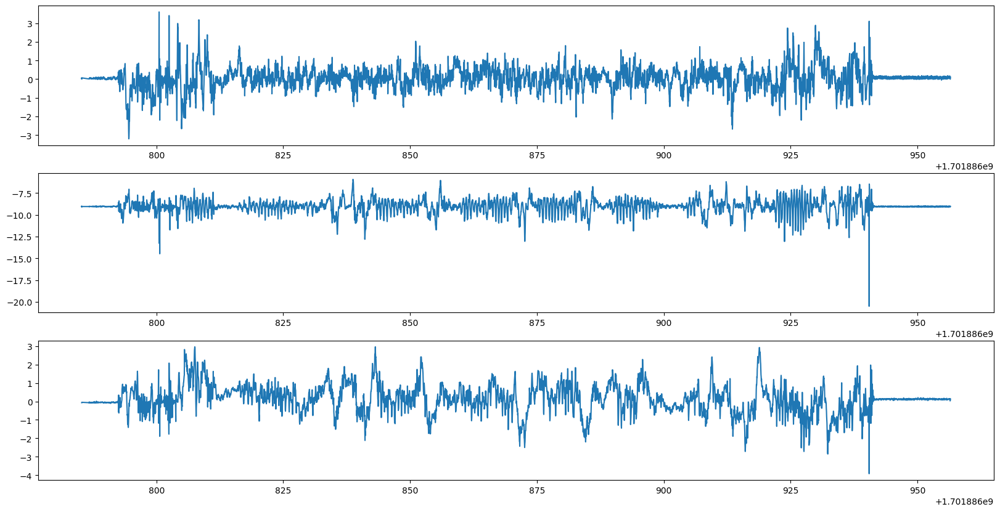

In [96]:
import json
def save_imu_cam(timestamp, dataset_folder, acceleration, angular_velocity):
    # Save metadata (timestamps, parameters) as JSON
    metadata = {
        'timestamp': timestamp, 
        'acceleration': acceleration,
        'angular_velocity': angular_velocity
    }
    # Use the custom NumpyEncoder to handle int64 and float conversion
    metadata_json = json.dumps(metadata, cls=NumpyEncoder)

    output_file = 'imu_cam.json'
    output_path = os.path.join(dataset_folder, output_file)

    with open(output_path, 'a') as file:
        file.write(metadata_json + '\n') 
path = '/Users/david/Documents/thesis/Thesis_code/data_collection/imu_data/imu_cam.json'
# read json file
with open(path, 'r') as file:
    data = file.read().split('\n')

# Convert the all JSON string into a dictionary
data_dict = [json.loads(line) for line in data if line != '']
# load all acceleration and angular velocity
acceleration = []
angular_velocity = []
timestamp = []
for i in range(len(data_dict)):
    acceleration.append(data_dict[i]['acceleration'])
    angular_velocity.append(data_dict[i]['angular_velocity'])
    timestamp.append(data_dict[i]['timestamp'])
# convert to numpy array
acceleration = np.array(acceleration)
angular_velocity = np.array(angular_velocity)
timestamp = np.array(timestamp)
# plt 0 1 2 of acceleration in 3 subplots in wide figure
plt.figure(figsize=(20,10))
plt.subplot(3,1,1)
plt.plot(timestamp, acceleration[:,0])
plt.subplot(3,1,2)
plt.plot(timestamp, acceleration[:,1])
plt.subplot(3,1,3)
plt.plot(timestamp, acceleration[:,2])



In [ ]:
\

In [78]:
# read json file
import json
path = '/Users/david/Documents/thesis/Thesis_code/data_collection/imu_data/imu_cam.json'
with open(path, 'r') as file:
    data = json.load(file)
# read timestamp acceleration angular_velocity
timestamp_cam = []
acceleration_cam = []
angular_velocity_cam = []
for item in data:
    timestamp_cam.append(item['timestamp'])
    acceleration_cam.append(item['acceleration'])
    angular_velocity_cam.append(item['angular_velocity'])



JSONDecodeError: Extra data: line 2 column 1 (char 187)

### Alignment of timestamps from IMU

In [125]:
# get index when acceleration is larger than 16
index = np.where(df['accelerometer_m_s2[2]'] < -16)
print(df['timestamp'][index[0]])
index2 = np.where(acceleration[:,1] < -13)
print(index2[0])
print(timestamp[index2[0]])
time_cam = timestamp[index2[0][0]]- timestamp[index2[0][-1]]
print(time_cam)
time_df = (df['timestamp'][index[0][0]] - df['timestamp'][index[0][1]])/1e6
print(time_df)
# print the timestamp of picked index and index2
print(df['timestamp'][index[0][0]])
print(df['timestamp'][index[0][1]])
print(timestamp[index2[0][0]])
print(timestamp[index2[0][-1]])
compensation = - df['timestamp'][index[0][0]]/1e6 + timestamp[index2[0][0]]
print(compensation)


36861    3234239512
64884    3374221330
71822    3408876977
71823    3408881972
71824    3408886967
72248    3411004861
Name: timestamp, dtype: int64
[ 394  398 2405 3821 4286]
[1.70188680e+09 1.70188680e+09 1.70188687e+09 1.70188692e+09
 1.70188694e+09]
-139.96203541755676
-139.981818
3234239512
3374221330
1701886800.5190535
1701886940.4810889
1701883566.2795415


In [110]:
# get index when acceleration is larger than 16
index = np.where(df['accelerometer_m_s2[2]'] < -16)
print(df['timestamp'][index[0]])

36861    3234239512
64884    3374221330
71822    3408876977
71823    3408881972
71824    3408886967
72248    3411004861
Name: timestamp, dtype: int64


0.28635721034829764
-0.023797631969851272
-9.830094195833334
0.0020178240054855253
0.0017592206368581425
0.0017427009552286577


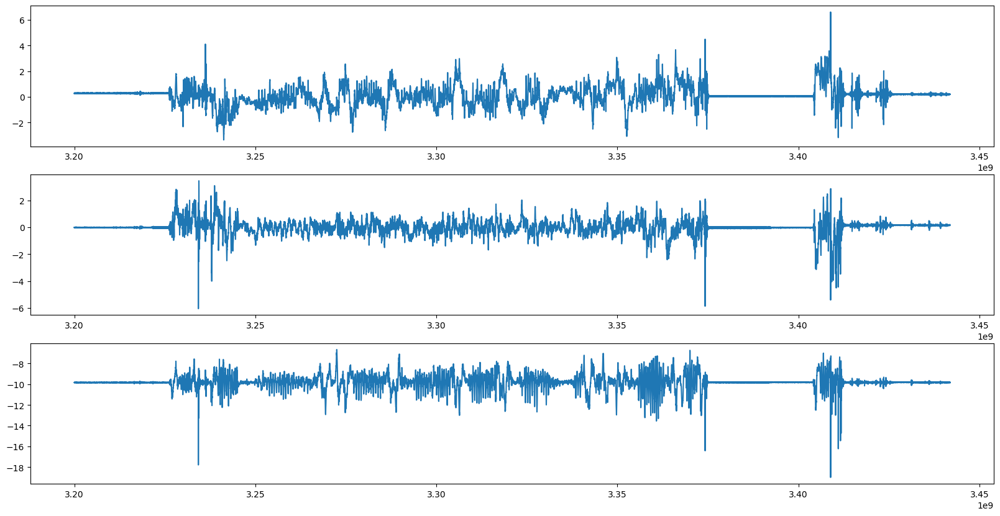

In [166]:
import matplotlib.pyplot as plt
import pandas as pd
# load imu data
path = '/Users/david/Documents/thesis/Thesis_code/data_collection/imu_data/log_320_2023-12-6-19-09-12_sensor_combined_0.csv'
df = pd.read_csv(path)

# wide figure of 3 subplots with [num:]
num = 30000
plt.figure(figsize=(20,10))
plt.subplot(3,1,1)
plt.plot(df['timestamp'][num:],df['accelerometer_m_s2[0]'][num:])
plt.subplot(3,1,2)
plt.plot(df['timestamp'][num:],df['accelerometer_m_s2[1]'][num:])
plt.subplot(3,1,3)
plt.plot(df['timestamp'][num:],df['accelerometer_m_s2[2]'][num:])
# mean of formal 20000 data
print(df['accelerometer_m_s2[0]'][0:num].mean())
print(df['accelerometer_m_s2[1]'][0:num].mean())
print(df['accelerometer_m_s2[2]'][0:num].mean())
# also calculate the gyro
print(df['gyro_rad[0]'][0:num].mean())
print(df['gyro_rad[1]'][0:num].mean())
print(df['gyro_rad[2]'][0:num].mean())


In [16]:
import pandas as pd
path = '/Users/david/Documents/thesis/Thesis_code/data_collection/bag_all/fortesttest2/vrpn_client_node-HaoranDrone-pose.csv'
df = pd.read_csv(path)
df


,Time,header.seq,header.stamp.secs,header.stamp.nsecs,header.frame_id,pose.position.x,pose.position.y,pose.position.z,pose.orientation.x,pose.orientation.y,pose.orientation.z,pose.orientation.w
0,1.701887e+09,201514,1701886667,852152009,world,5.702338,-3.123139,1.018846,0.015143,0.017967,-0.804808,-0.593071
1,1.701887e+09,201515,1701886667,852212347,world,5.702320,-3.123170,1.018849,0.015270,0.017155,-0.804953,-0.592894
2,1.701887e+09,201516,1701886667,862168460,world,5.702302,-3.123076,1.018748,0.014885,0.017600,-0.805121,-0.592662
3,1.701887e+09,201517,1701886667,862228687,world,5.702312,-3.123136,1.018830,0.014582,0.017685,-0.805304,-0.592418
4,1.701887e+09,201518,1701886667,872155836,world,5.702337,-3.123065,1.018756,0.015310,0.017891,-0.804772,-0.593117
...,...,...,...,...,...,...,...,...,...,...,...,...
32063,1.701887e+09,234386,1701886962,282065901,world,0.416329,-3.513587,0.182066,0.001187,-0.003297,0.062244,-0.998055
32064,1.701887e+09,234387,1701886962,292028982,world,0.416279,-3.513494,0.181921,0.002005,-0.002591,0.062245,-0.998056
32065,1.701887e+09,234388,1701886962,292054531,world,0.416300,-3.513551,0.181986,0.001410,-0.002991,0.062216,-0.998057
32066,1.701887e+09,234389,1701886962,302080308,world,0.416337,-3.513573,0.182024,0.001118,-0.002991,0.062512,-0.998039


In [9]:
import torch
import mmdet
from mmdet.apis import init_detector,inference_detector
from mmcv.ops import get_compiling_cuda_version, get_compiler_version
from segments_generator import get_pcd_from_rgbd, save_segments
import numpy as np
import cv2
import open3d as o3d
import math

ModuleNotFoundError: No module named 'mmdet'

In [5]:
print('torch.__version__ and CUDA: ',torch.__version__, torch.cuda.is_available())
print('mmdet.__version__: ',mmdet.__version__)
print('get_compiling_cuda_version: ',get_compiling_cuda_version())
print('get_compiler_version: ',get_compiler_version())


torch.__version__ and CUDA:  2.1.1 False
mmdet.__version__:  3.2.0
get_compiling_cuda_version:  not available
get_compiler_version:  clang 13.0.0


In [20]:
from mmdet.apis import DetInferencer

# Choose to use a config and initialize the detector
config = '/Users/david/Documents/thesis/Thesis_code/model_2d/hr_thesis_dataset_evaluator_config.py'
#config = 'rtmdet-ins_s_8xb32-300e_coco.py'
# Setup a checkpoint file to load
checkpoint = '/Users/david/Documents/thesis/Thesis_code/model_2d/epoch_1.pth'

# Initialize the DetInferencer
inferencer = DetInferencer(model=config, weights=checkpoint)
# Perform inference
inferencer('/Users/david/Documents/thesis/Thesis_code/data_collection/data_collection/global_dataWed Dec  6 19:05:27 2023/rgb', out_dir='/Users/david/Documents/thesis/Thesis_code/outputs/global/', no_save_pred=False)


Loads checkpoint by local backend from path: /Users/david/Documents/thesis/Thesis_code/model_2d/epoch_1.pth


Output()

/Users/david/opt/anaconda3/envs/openmmlab/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:196: UserWarning: Failed to add <class 'mmengine.visualization.vis_backend.LocalVisBackend'>, please provide the `save_dir` argument.
  warnings.warn(f'Failed to add {vis_backend.__class__}, '


/Users/david/opt/anaconda3/envs/openmmlab/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: 
UserWarning: Warning: The bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/Users/david/opt/anaconda3/envs/openmmlab/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: 
UserWarning: Warning: The polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

{'predictions': [{'labels': [0, 0, 3, 0, 3, 1, 3, 0, 1, 1, 2, 3],
   'scores': [0.9726333022117615,
    0.6605662703514099,
    0.4614744186401367,
    0.2461625039577484,
    0.13692614436149597,
    0.1313495934009552,
    0.12973782420158386,
    0.11286476254463196,
    0.1127949208021164,
    0.09067084640264511,
    0.05928042531013489,
    0.05615019053220749],
   'bboxes': [[121.22821807861328,
     545.5529174804688,
     207.74954223632812,
     610.2874145507812],
    [548.3541259765625, 714.1705322265625, 620.4002685546875, 720.0],
    [91.16812133789062,
     227.50755310058594,
     489.5916748046875,
     453.0572204589844],
    [1062.4215087890625, 444.07318115234375, 1123.25048828125, 519.30078125],
    [1064.2205810546875,
     443.4788513183594,
     1124.5396728515625,
     516.743896484375],
    [74.94427490234375,
     212.084716796875,
     495.2890319824219,
     487.6919250488281],
    [1103.6597900390625,
     203.02589416503906,
     1274.75439453125,
     56

In [ ]:



# Choose to use a config and initialize the detector
config = '/home/haoran/mmdetection/configs/rtmdet/rtmdet-ins_tiny_8xb32-300e_coco.py'
checkpoint = '/home/haoran/Documents/Thesis/Thesis_codes/pre_trained_models/rtmdet-ins_tiny_8xb32-300e_coco_20221130_151727-ec670f7e.pth'

# Load pretrained model
model = init_detector(config,checkpoint=checkpoint, device='cuda:0')

# Configure depth and color streams
pipeline = rs.pipeline()
config = rs.config()


# Get device product line for setting a supporting resolution
pipeline_wrapper = rs.pipeline_wrapper(pipeline)
pipeline_profile = config.resolve(pipeline_wrapper)
device = pipeline_profile.get_device()
device_product_line = str(device.get_info(rs.camera_info.product_line))

found_rgb = False
for s in device.sensors:
    if s.get_info(rs.camera_info.name) == 'RGB Camera':
        found_rgb = True
        break
if not found_rgb:
    print("The demo requires Depth camera with Color sensor")
    exit(0)

config.enable_stream(rs.stream.depth, 640, 480, rs.format.z16, 30)
config.enable_stream(rs.stream.color, 640, 480, rs.format.bgr8, 30)
# Enable IMU
config.enable_stream(rs.stream.gyro, rs.format.motion_xyz32f, 400)
config.enable_stream(rs.stream.accel, rs.format.motion_xyz32f, 250)

# Start streaming
profile = pipeline.start(config)

d_sensor=profile.get_device().first_depth_sensor()
# d_sensor.set_option(rs.option.visual_preset, 3)
d_sensor.set_option(rs.option.global_time_enabled,1)

# Create an Open3D window for real-time visualization
vis = o3d.visualization.Visualizer()
vis.create_window('RealSense Point Cloud', width=640, height=480)

# Get the colormap
colors = model.dataset_meta['palette']
label_to_color = {label: colors[label] for label in range(len(colors))}

n = 0
# Create mesh for coordinate frame
coord_frame = o3d.geometry.TriangleMesh.create_coordinate_frame(size=0.1)
position = np.array([0.0, 0.0, 0.0])
velocity = np.array([0.0, 0.0, 0.0])
orientation = np.eye(3) 
try:
    while True:

        # Wait for a coherent pair of frames: depth and color
        frames = pipeline.wait_for_frames()
        depth_frame = frames.get_depth_frame()
        color_frame = frames.get_color_frame()
        # Get IMU data
        accel = frames.first_or_default(rs.stream.accel, rs.format.motion_xyz32f).as_motion_frame().get_motion_data()
        gyro = frames.first_or_default(rs.stream.gyro, rs.format.motion_xyz32f).as_motion_frame().get_motion_data()
        if not depth_frame or not color_frame:
            continue
        
        # Convert images to numpy arrays
        depth_image = np.asanyarray(depth_frame.get_data())
        color_image = np.asanyarray(color_frame.get_data())
        
        # or img = mmcv.imread(img), which will only load it once
        result = inference_detector(model, color_image)

        # Access the predicted instances data
        pred_instances = result.pred_instances

        # Extract the masks and bounding boxes from pred_instances
        masks = pred_instances.masks.cpu().numpy()
        bboxes = pred_instances.bboxes.cpu().numpy()
        labels = pred_instances.labels.cpu().numpy()
        scores = pred_instances.scores.cpu().numpy()
        mask_rgb = np.zeros_like(color_image)
        segments_rgb_list = []

        for mask, label, score in zip(masks, labels, scores):
            if score < 0.4: # threshold to filter out low-confidence instances
                continue
            color = label_to_color.get(label, (0, 0, 0))  # Default to black if label is not found
            mask_rgb[mask > 0] = color
            segments_rgb = np.zeros_like(color_image)    
            segments_rgb[mask > 0] = color
            segments_rgb_list.append(segments_rgb)

        #rgbd_image = o3d.geometry.create_rgbd_image_from_color_and_depth(color_image, depth_image)
        depth_scale = pipeline.get_active_profile().get_device().first_depth_sensor().get_depth_scale()
        #depth_trunc = pipeline.get_active_profile().get_device().first_depth_sensor().get_option(rs.option.depth_units)
        depth_intrin = depth_frame.profile.as_video_stream_profile().intrinsics
        #print("depth_intrin:"+str(depth_intrin))
        
        pc = rs.pointcloud()
        points = pc.calculate(depth_frame)

        # Pointcloud data to arrays
        v = points.get_vertices()
        verts = np.asanyarray(v).view(np.float32).reshape(-1, 3)  # xyz
        #print("verts:"+str(verts))
        #o3d.visualization.draw_geometries([points])

        
        # create segments point cloud
        segments_pcd_list = []
        for segment_rgb in segments_rgb_list:
            segment_pcd = get_pcd_from_rgbd(segment_rgb, depth_image, depth_intrin, depth_scale)
            segments_pcd_list.append(segment_pcd)

        # save segments
        save_segments(segments_pcd_list, depth_frame.get_timestamp()/1000, labels, depth_intrin, depth_scale, scores)
        # create pcd for all segments
        pcd = get_pcd_from_rgbd(mask_rgb, depth_image, depth_intrin, depth_scale)

        # Add mesh to point cloud
        #pcd += coord_frame
 
        # Transform point cloud using IMU data
        imu_transform = np.eye(4)

        acceleration = np.array([accel.x, accel.y, accel.z])
        #angular_velocity = np.array([gyro.x, gyro.y, gyro.z])
        angular_velocity = np.array([gyro.z, gyro.y, gyro.x])
        rotation_matrix = o3d.geometry.get_rotation_matrix_from_zyx(angular_velocity * np.pi / 180.0)
        rotation_matrix = np.vstack((rotation_matrix, [0, 0, 0]))
        rotation_matrix = np.hstack((rotation_matrix, np.array([[0], [0], [0], [1]])))
        imu_transform = imu_transform @ rotation_matrix
        
        if n < 8:
            d_time = depth_frame.get_timestamp()/1000
            n += 1
            vis.clear_geometries()
            vis.poll_events()
            vis.update_renderer()
        else:
            d_time_0 = d_time
            d_time = depth_frame.get_timestamp()/1000
            inteval = d_time - d_time_0
            print("Depth frame timestamp:"+str(d_time))
            imu_transform[:3, 3] += 0.5 * acceleration * inteval ** 2  
            #pcd.transform(imu_transform)


            # Integrate acceleration to update velocity
            velocity += acceleration * inteval
            # Integrate velocity to update camera position
            position += velocity * inteval
            # Integrate angular velocity to update orientation
            delta_rotation_matrix = np.eye(3)  # Calculate using integration
            delta_rotation_matrix = o3d.geometry.get_rotation_matrix_from_zyx(
        angular_velocity * np.pi / 180.0 * inteval)  # Convert to radians
            orientation = np.dot(orientation, delta_rotation_matrix)

            # Update the point cloud position and orientation
            #coord_frame.translate(position)
            #coord_frame.rotate(orientation)
            #coord_frame.points = o3d.utility.Vector3dVector(np.array(coord_frame.points) + position)
            #coord_frame.rotate(delta_rotation_matrix)
            
            
            #o3d.visualization.draw_geometries([downpcd])
            vis.clear_geometries()
            vis.add_geometry(pcd)
            vis.add_geometry(coord_frame)
            #vis.update_geometry(downpcd)
            vis.poll_events()
            vis.update_renderer()

            # Convert depth image to 8-bit grayscale
            depth_image_8bit = cv2.convertScaleAbs(depth_image, alpha=0.03)
            # Convert grayscale image to 3-channel RGB image
            depth_image_rgb = cv2.cvtColor(depth_image_8bit, cv2.COLOR_GRAY2RGB)

            # Blend mask with original image
            alpha = 0.5
            mask_bgr = cv2.cvtColor(mask_rgb, cv2.COLOR_RGB2BGR)
            blended_image = cv2.addWeighted(color_image, alpha, mask_bgr, 1 - alpha, 0)
            concatenated_image = np.hstack((blended_image, depth_image_rgb))
            cv2.imshow("Color and Depth Images", concatenated_image)

            #o3d.io.write_point_cloud(str(d_time) + '.pcd', downpcd, write_ascii=False, compressed=False, print_progress=False)
        # Exit loop if 'q' key is pressed
        if cv2.waitKey(1) & 0xFF == ord('q'):
            break
finally:

    # Stop streaming
    pipeline.stop()

    # Close OpenCV windows
    cv2.destroyAllWindows()

    # Close the Open3D window
    vis.destroy_window()


In [2]:
import tensorflow as tf


: 

In [9]:
import tensorflow as tf
import numpy as np
from segmappy.segmappy.core.config import Config
from segmappy.segmappy.core.dataset import Dataset
from segmappy.segmappy.core.generator import Generator
from segmappy.segmappy.tools.classifiertools import get_default_preprocessor, get_default_dataset
import os

Error: Could not create SegMap home directory


FileNotFoundError: [Errno 2] No such file or directory: '/home/haoran/Documents/Thesis/Thesis_codes/segmappy/segmappy/config'

In [2]:
import tensorflow as tf
import numpy as np
from segmappy.segmappy.core.config import Config
from segmappy.segmappy.core.dataset import Dataset
from segmappy.segmappy.core.generator import Generator
from segmappy.segmappy.tools.classifiertools import get_default_preprocessor, get_default_dataset
import os
# read config file
configfile = "haoranDronev1.ini"
config = Config(configfile)
trained_model_folder = "/home/haoran/Documents/Thesis/Thesis_codes/model_cnn"

tf.compat.v1.disable_eager_execution()

# load dataset and preprocessor
dataset = get_default_dataset(config, config.cnn_test_folder)
segments, positions, classes, n_classes = dataset.load_for_pred()
preprocessor = get_default_preprocessor(config)

# Generate descriptors, segments and segments_processed
preprocessor.init_segments(segments, [0] * len(segments), positions=positions)
segments_processed = preprocessor.process(segments, train=False, normalize=False)

gen_test = Generator(
    preprocessor,
    range(len(segments)),
    1,
    train=False,
    batch_size=config.batch_size,
    shuffle=False,
)

tf.compat.v1.reset_default_graph()

# restore variable names from previous session
saver = tf.compat.v1.train.import_meta_graph(
    os.path.join(config.cnn_model_folder, "model.ckpt.meta")
)

graph = tf.compat.v1.get_default_graph()
cnn_input = graph.get_tensor_by_name("InputScope/input:0")
descriptor = graph.get_tensor_by_name("OutputScope/descriptor_read:0")
scales = graph.get_tensor_by_name("scales:0")

# generate descriptors
features = []
with tf.compat.v1.Session() as sess:
    saver.restore(sess, tf.compat.v1.train.latest_checkpoint(config.cnn_model_folder))

    for step in range(0, gen_test.n_batches):
        batch_segments, batch_classes = gen_test.next()

        # calculate descriptors
        batch_descriptor = batch_descriptors = sess.run(
            descriptor,
            feed_dict={cnn_input: batch_segments, scales: preprocessor.last_scales},
        )

        features.append(batch_descriptor)

    features = np.concatenate(features, axis=0)

Error: Could not create SegMap home directory


FileNotFoundError: [Errno 2] No such file or directory: '/home/haoran/Documents/Thesis/Thesis_codes/segmappy/segmappy/config'

In [75]:
import numpy as np
from sklearn.neighbors import KDTree

# np is mutable, so we need to copy the array
local_seg = features[141].copy().reshape(1, 64)
local_segent = segments[141].copy()

# add noise to point cloud
noise = np.random.normal(0, 2, size=local_seg.shape)
noise2 = np.random.normal(0, 2, size=local_segent.shape)
local_seg += noise
local_segent += noise2

# Build a kd-tree from the global descriptors
tree = KDTree(features)

# Find the k-nearest neighbors of each local descriptor
knn_dists, indices = tree.query(local_seg, k=5)

# Compute the centroids of the local and global point cloud
x, y, z = np.mean(local_segent, axis=0)
centroid_local = np.array([x, y, z])
centroids_global = []

# Initialize variables to keep track of the best match
best_distance = float('inf')
best_match_index = -1
combined_dist_list = []
euclidean_dist_list = []

# Compute the centroids of the global point clouds with indices from the previous step
for i, knn_dist in zip(indices[0], knn_dists[0]):
    x, y, z = np.mean(segments[i], axis=0)
    centroid_global = np.array([x, y, z])

    # Calculate the Euclidean distance between the centroids
    euclidean_dist = np.linalg.norm(centroid_local - centroid_global)  
    combined_dist = 0.7 * knn_dist + 0.3 * euclidean_dist  
    euclidean_dist_list.append(euclidean_dist)
    combined_dist_list.append(combined_dist)

    # Update the best match if the current one is better
    if combined_dist < best_distance:
        best_distance = combined_dist
        best_match_index = i
        
print('KNN distances', knn_dists)
print('Euclidean distances ', euclidean_dist_list)
print('best_match_index', best_match_index,'from list', indices[0],'\nwith combined distances', combined_dist_list)

KNN distances [[14.25829191 15.65794399 16.48680727 21.0180683  21.72923104]]
Euclidean distances  [0.18293320543292954, 0.1657807858679148, 0.1920202400850277, 0.20582275486206475, 129.33823194788604]
best_match_index 141 from list [ 141  140  142  143 7772] 
with combined distances [10.035684297614724, 11.010295026122476, 11.598371159864007, 14.774394638967204, 54.01193130887643]


0


In [78]:
# Find the largest subset of correspondences with consistent centroidsbest_indices = []
k = 5
centroidsbest_indices = []
for i in range(len(centroids_global)):
    diffs = centroids_global[i] - centroid_local
    distances = np.linalg.norm(diffs, axis=1)
    closest = np.argsort(distances)[:k]
    if np.allclose(diffs[closest], diffs[closest[0]]):
        centroidsbest_indices.append(indices[i, closest])


AxisError: axis 1 is out of bounds for array of dimension 1

In [ ]:


# Estimate the 6-DoF transformation between the local and global maps
A = np.hstack((global_segments[:, best_indices].reshape(-1, k * 3), np.ones((len(best_indices) * k, 1))))
b = local_segments.reshape(-1, 1)
x, _, _, _ = np.linalg.lstsq(A, b, rcond=None)
T = np.eye(4)
T[:3, :] = x.reshape(3, 4)


In [9]:

tf.compat.v1.reset_default_graph()

# restore variable names from previous session
saver = tf.compat.v1.train.import_meta_graph(
    os.path.join(config.semantics_model_folder, "model.ckpt.meta")
)

graph = tf.compat.v1.get_default_graph()
nn_input = graph.get_tensor_by_name("InputScope/input:0")
pred = graph.get_tensor_by_name("OutputScope/output_read:0")

descriptor = features[0]
with tf.compat.v1.Session() as sess:
    saver.restore(sess, tf.compat.v1.train.latest_checkpoint(config.semantics_model_folder))
    
    prediction = sess.run([pred], feed_dict={nn_input: feature})
    print("feature: ", feature, " prediction ", prediction)

INFO:tensorflow:Restoring parameters from /home/haoran/Documents/Thesis/Thesis_codes/segmappy/trained_models/segmap64_semantics/model.ckpt


feature:  [[ 8.63761806  3.761235    4.07325602 11.85404968  6.23984528  9.12554169
   7.80759668  9.79868031  0.          7.92273474  8.66307259  0.
   1.5684731   4.09431839  2.17195559  5.85905218  6.87391901  6.45440674
   6.84167433  2.74538994  6.47014618  0.52085644  2.63681841 11.07420826
   4.94913578  5.82422304  9.77447987  4.01857471  3.34154654 12.97259426
   6.07500744  7.60166788  3.65368128  4.48369884 12.00786209 10.10914707
   6.44067144 10.46491623  3.39597678 10.14689159  5.84122658  2.42115045
   0.          5.72027159  5.34569788  1.19732487  4.8512125   6.92753458
  10.8617115   7.37795067  6.24125528 10.2950325   2.96485329  6.16819334
   6.59473467  7.8805213   9.34862804  7.55768347  7.97991037  6.32823086
   5.31985331  0.75441498  3.14219236  1.90935588]]  prediction  [array([[  6.7041454, -23.521523 ,   4.8670945]], dtype=float32)]


In [ ]:

saver_semantics = tf.compat.v1.train.import_meta_graph(
    os.path.join(config.semantics_model_folder, "model.ckpt.meta")
)


In [2]:
# load dataset and preprocessor
preprocessor = get_default_preprocessor(config)

dataset = Dataset(
    folder=config.cnn_test_folder,
    base_dir=config.base_dir,
    keep_match_thresh=0.7,
    require_change=0.1,
    require_relevance=0.05,
)
segments, positions, classes, n_classes = dataset.load_for_pred(
    preprocessor=preprocessor
)

preprocessor.init_segments_pred(segments, classes, positions)

gen_test = Generator(
    preprocessor,
    range(len(segments)),
    n_classes,
    train=False,
    batch_size=1,
    shuffle=False,
)

  Found 28993 segments from 4441 sequences
  Found positions for 28993 segments
  Found 28993 segments that changed enough
  Found 27305 segments that are relevant
  Found 4441 valid classes with 27305 segments


In [3]:
classes

array([   0,    0,    0, ..., 4438, 4439, 4440])

In [4]:
batch_segments, batch_classes = gen_test.next()

In [5]:
np.array(batch_segments).shape

(1, 32, 32, 16, 1)

In [6]:
batch_classes

array([[0., 0., 0., ..., 0., 0., 0.]])

In [7]:
pred.shape

(1, 2558)

In [7]:
# restore the graph from the meta graph
cnn_graph = tf.compat.v1.get_default_graph()
cnn_input = cnn_graph.get_tensor_by_name("InputScope/input:0")
y_true = cnn_graph.get_tensor_by_name("y_true:0")
training = cnn_graph.get_tensor_by_name("training:0")
scales = cnn_graph.get_tensor_by_name("scales:0")

loss = cnn_graph.get_tensor_by_name("loss:0")
loss_c = cnn_graph.get_tensor_by_name("loss_c:0")
loss_r = cnn_graph.get_tensor_by_name("loss_r:0")

accuracy = cnn_graph.get_tensor_by_name("accuracy:0")
y_prob = cnn_graph.get_tensor_by_name("y_prob:0")
descriptor = cnn_graph.get_tensor_by_name("OutputScope/descriptor_read:0")
roc_auc = cnn_graph.get_tensor_by_name("roc_auc:0")

global_step = cnn_graph.get_tensor_by_name("global_step:0")
#update_step = cnn_graph.get_tensor_by_name("update_step:0")
update_step = cnn_graph.get_operation_by_name("update_step")
train_op = cnn_graph.get_operation_by_name("train_op")

summary_batch = tf.compat.v1.summary.merge_all("summary_batch")
summary_epoch = tf.compat.v1.summary.merge_all("summary_epoch")

with tf.compat.v1.Session() as sess:
    # initialize all tf variables
    tf.compat.v1.global_variables_initializer().run()
    saver = tf.compat.v1.train.import_meta_graph(os.path.join(config.cnn_model_folder, "model.ckpt.meta"))
    dscrpt,pred = sess.run([descriptor,y_prob], feed_dict={cnn_input: batch_segments, scales: preprocessor.last_scales})
    print(dscrpt)
    print(pred.shape)


2023-11-28 00:18:01.457375: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-28 00:18:03.728520: W tensorflow/core/common_runtime/gpu/gpu_device.cc:1960] Cannot dlopen some GPU libraries. Please make sure the missing libraries mentioned above are installed properly if you would like to use GPU. Follow the guide at https://www.tensorflow.org/install/gpu for how to download and setup the required libraries for your platform.
Skipping registering GPU devices...
2023-11-28 00:18:03.749099: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:375] MLIR V1 optimization pass is not enabled


[[0.03507338 0.         0.0168565  0.00483121 0.         0.02282924
  0.04191985 0.         0.         0.         0.02086491 0.
  0.         0.         0.01811004 0.07924166 0.02022755 0.00842145
  0.02846467 0.         0.         0.         0.00078332 0.02402123
  0.         0.09247084 0.00347632 0.06366442 0.         0.04576809
  0.01794412 0.         0.         0.         0.         0.03187555
  0.0967621  0.00591848 0.         0.04552313 0.00331411 0.
  0.         0.         0.         0.03768271 0.04058842 0.
  0.01840309 0.01374868 0.05831392 0.08993417 0.         0.
  0.         0.07591386 0.05186188 0.         0.01007617 0.
  0.05800783 0.         0.03546482 0.01807743]]
(1, 2558)


In [ ]:
import numpy as np
from sklearn.neighbors import KDTree

def localization(global_segments, local_segments, descriptors, k=5):
    # Build a kd-tree from the global descriptors
    tree = KDTree(descriptors)

    # Find the k-nearest neighbors of each local descriptor
    _, indices = tree.query(local_segments, k=k)

    # Compute the centroids of the local and global segments
    local_centroids = np.mean(local_segments, axis=1)
    global_centroids = np.mean(global_segments[:, indices], axis=2)

    # Find the largest subset of correspondences with consistent centroids
    best_indices = []
    for i in range(len(local_segments)):
        diffs = global_centroids - local_centroids[i]
        distances = np.linalg.norm(diffs, axis=1)
        closest = np.argsort(distances)[:k]
        if np.allclose(diffs[closest], diffs[closest[0]]):
            best_indices.append(indices[i, closest])

    # Estimate the 6-DoF transformation between the local and global maps
    A = np.hstack((global_segments[:, best_indices].reshape(-1, k * 3), np.ones((len(best_indices) * k, 1))))
    b = local_segments.reshape(-1, 1)
    x, _, _, _ = np.linalg.lstsq(A, b, rcond=None)
    T = np.eye(4)
    T[:3, :] = x.reshape(3, 4)

    return T


In [31]:
pred.shape

(1, 2558)

In [ ]:
# get key tensorflow variables
    cnn_graph = tf.compat.v1.get_default_graph()

    cnn_input = cnn_graph.get_tensor_by_name("InputScope/input:0")
    scales = cnn_graph.get_tensor_by_name("scales:0")
    descriptor = cnn_graph.get_tensor_by_name("OutputScope/descriptor_read:0")

In [8]:
with tf.compat.v1.Session() as sess:
    # restore variables
    # saver.restore(sess, model_path)
    # get key tensorflow variables
    #cnn_graph = tf.compat.v1.get_default_graph()

    #cnn_input = cnn_graph.get_tensor_by_name("InputScope/input:0")
    #scales = cnn_graph.get_tensor_by_name("scales:0")
    #descriptor = cnn_graph.get_tensor_by_name("OutputScope/descriptor_read:0")

    # run prediction
    # run optimizer and calculate loss and accuracy
    cnn_input = cnn_graph.get_tensor_by_name("InputScope/input:0")
    y_true = cnn_graph.get_tensor_by_name("y_true:0")
    training = cnn_graph.get_tensor_by_name("training:0")
    scales = cnn_graph.get_tensor_by_name("scales:0")

    loss = cnn_graph.get_tensor_by_name("loss:0")
    loss_c = cnn_graph.get_tensor_by_name("loss_c:0")
    loss_r = cnn_graph.get_tensor_by_name("loss_r:0")

    accuracy = cnn_graph.get_tensor_by_name("accuracy:0")
    y_prob = cnn_graph.get_tensor_by_name("y_prob:0")
    descriptor = cnn_graph.get_tensor_by_name("OutputScope/descriptor_read:0")
    roc_auc = cnn_graph.get_tensor_by_name("roc_auc:0")

    global_step = cnn_graph.get_tensor_by_name("global_step:0")
    #update_step = cnn_graph.get_tensor_by_name("update_step:0")
    update_step = cnn_graph.get_operation_by_name("update_step")
    train_op = cnn_graph.get_operation_by_name("train_op")

    summary_batch = tf.compat.v1.summary.merge_all("summary_batch")
    summary_epoch = tf.compat.v1.summary.merge_all("summary_epoch")

    summary, batch_loss, batch_loss_c, batch_loss_r, batch_accuracy, batch_prob, _ = sess.run(
        [summary_batch, loss, loss_c, loss_r, accuracy, y_prob, train_op],
        feed_dict={
            cnn_input: segments,
            y_true: classes,
            training: False,
            scales: preprocessor.last_scales,
        },
    )


    # show prediction
    print("batch_loss: ", batch_loss)

ValueError: setting an array element with a sequence. The requested array has an inhomogeneous shape after 1 dimensions. The detected shape was (12643,) + inhomogeneous part.

In [ ]:
# cnn features
print("Generating cnn features")
gen_test = Generator(
    preprocessor,
    range(len(segments)),
    n_classes,
    train=False,
    batch_size=config.batch_size,
    shuffle=False,
)


In [ ]:
    sess.graph.as_default()
    tf.import_graph_def(graph_def, name='')
# Create a session and restore the model
sess = tf.compat.v1.Session(graph=graph)
saver = tf.compat.v1.train.Saver()
saver.restore(sess, model_path)

# Perform prediction
input_data = np.array(...)  # Replace with your input data
# Preprocess the input data if necessary

# Get the input and output tensors from the graph
input_tensor = graph.get_tensor_by_name('cnn_input:0')  # Replace with the actual input tensor name
output_tensor = graph.get_tensor_by_name('y_prob:0')  # Replace with the actual output tensor name

# Run the inference
predictions = sess.run(output_tensor, feed_dict={input_tensor: input_data})

# Process the predictions as needed


In [1]:
import tensorflow as tf 
tf. __version__ 

2023-11-20 23:14:26.103864: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-11-20 23:15:00.242356: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


'2.13.1'

In [2]:
import tensorflow as tf
tf.sysconfig.get_build_info()

OrderedDict([('cpu_compiler', '/usr/lib/llvm-16/bin/clang'),
             ('cuda_compute_capabilities',
              ['sm_35', 'sm_50', 'sm_60', 'sm_70', 'sm_75', 'compute_80']),
             ('cuda_version', '11.8'),
             ('cudnn_version', '8'),
             ('is_cuda_build', True),
             ('is_rocm_build', False),
             ('is_tensorrt_build', True)])

In [8]:
import torch
import mmdet
from mmdet.apis import init_detector,inference_detector
from mmcv.ops import get_compiling_cuda_version, get_compiler_version
import pyrealsense2 as rs
import numpy as np
import cv2


print('torch.__version__ and CUDA: ',torch.__version__, torch.cuda.is_available())
print('mmdet.__version__: ',mmdet.__version__)
print('get_compiling_cuda_version: ',get_compiling_cuda_version())
print('get_compiler_version: ',get_compiler_version())

torch.__version__ and CUDA:  2.1.0 True
mmdet.__version__:  3.1.0
get_compiling_cuda_version:  12.2
get_compiler_version:  GCC 11.4


In [1]:
import torch, torchvision
import mmdet
from mmdet.apis import init_detector,inference_detector
import mmcv
from mmcv.ops import get_compiling_cuda_version, get_compiler_version
from matplotlib import pyplot as plt
from mmdet.registry import VISUALIZERS

print('torch.__version__ and CUDA: ',torch.__version__, torch.cuda.is_available())
print('mmdet.__version__: ',mmdet.__version__)
print('get_compiling_cuda_version: ',get_compiling_cuda_version())
print('get_compiler_version: ',get_compiler_version())

# Choose to use a config and initialize the detector
config = '/home/haoran/mmdetection/configs/rtmdet/rtmdet-ins_tiny_8xb32-300e_coco.py'
#config = 'rtmdet-ins_s_8xb32-300e_coco.py'

# Setup a checkpoint file to load
checkpoint = 'pre_trained_models/rtmdet-ins_tiny_8xb32-300e_coco_20221130_151727-ec670f7e.pth'
#checkpoint = 'pre_trained_models/rtmdet-ins_s_8xb32-300e_coco_20221121_212604-fdc5d7ec.pth'

# Load pretrained model
model = init_detector(config,checkpoint=checkpoint, device='cuda:0')

#print('model info:'model)

torch.__version__ and CUDA:  2.1.0 True
mmdet.__version__:  3.1.0
get_compiling_cuda_version:  12.2
get_compiler_version:  GCC 11.4
Loads checkpoint by local backend from path: pre_trained_models/rtmdet-ins_tiny_8xb32-300e_coco_20221130_151727-ec670f7e.pth


- The masks tensor is of shape (num_instances, height, width) where num_instances is the number of objects detected, and height and width are the dimensions of the image.
- Each element in the masks tensor is a boolean value, indicating whether a pixel belongs to the object (True) or not (False).

In [3]:
model.dataset_meta

{'classes': ('person',
  'bicycle',
  'car',
  'motorcycle',
  'airplane',
  'bus',
  'train',
  'truck',
  'boat',
  'traffic light',
  'fire hydrant',
  'stop sign',
  'parking meter',
  'bench',
  'bird',
  'cat',
  'dog',
  'horse',
  'sheep',
  'cow',
  'elephant',
  'bear',
  'zebra',
  'giraffe',
  'backpack',
  'umbrella',
  'handbag',
  'tie',
  'suitcase',
  'frisbee',
  'skis',
  'snowboard',
  'sports ball',
  'kite',
  'baseball bat',
  'baseball glove',
  'skateboard',
  'surfboard',
  'tennis racket',
  'bottle',
  'wine glass',
  'cup',
  'fork',
  'knife',
  'spoon',
  'bowl',
  'banana',
  'apple',
  'sandwich',
  'orange',
  'broccoli',
  'carrot',
  'hot dog',
  'pizza',
  'donut',
  'cake',
  'chair',
  'couch',
  'potted plant',
  'bed',
  'dining table',
  'toilet',
  'tv',
  'laptop',
  'mouse',
  'remote',
  'keyboard',
  'cell phone',
  'microwave',
  'oven',
  'toaster',
  'sink',
  'refrigerator',
  'book',
  'clock',
  'vase',
  'scissors',
  'teddy bear',


In [ ]:
import numpy as np
import cv2

# test a single image and show the results
image = mmcv.imread('img.png')  
# or img = mmcv.imread(img), which will only load it once
result = inference_detector(model, image)

# Access the predicted instances data
pred_instances = result.pred_instances

# Extract the masks and bounding boxes from pred_instances
masks = pred_instances.masks.cpu().numpy()
bboxes = pred_instances.bboxes.cpu().numpy()
labels = pred_instances.labels.cpu().numpy()
original_image = image.copy()

# Generate 80 distinct colors
num_labels = 80
colors = np.random.randint(0, 256, size=(num_labels, 3), dtype=np.uint8)
label_to_color = {label: colors[label] for label in range(num_labels)}

colored_masks = []  # List to store colored masks

for mask, label in zip(masks, labels):
    color = label_to_color.get(label, (0, 0, 0))  # Default to black if label is not found
    colored_mask = np.zeros((mask.shape[0], mask.shape[1], 3), dtype=np.uint8)
    colored_mask[mask > 0] = color
    colored_masks.append(colored_mask)
    
# Iterate through each mask and bounding box
for mask,colored_mask in zip(masks,colored_masks):

    original_image[mask > 0] = colored_mask[mask > 0]

# Display the image with the masks overlay
cv2.imshow('Image with Masks', original_image)
cv2.waitKey(0)
cv2.destroyAllWindows()

QObject::moveToThread: Current thread (0xb2f1f70) is not the object's thread (0x11ea25b0).
Cannot move to target thread (0xb2f1f70)

QObject::moveToThread: Current thread (0xb2f1f70) is not the object's thread (0x11ea25b0).
Cannot move to target thread (0xb2f1f70)

QObject::moveToThread: Current thread (0xb2f1f70) is not the object's thread (0x11ea25b0).
Cannot move to target thread (0xb2f1f70)

QObject::moveToThread: Current thread (0xb2f1f70) is not the object's thread (0x11ea25b0).
Cannot move to target thread (0xb2f1f70)

QObject::moveToThread: Current thread (0xb2f1f70) is not the object's thread (0x11ea25b0).
Cannot move to target thread (0xb2f1f70)

QObject::moveToThread: Current thread (0xb2f1f70) is not the object's thread (0x11ea25b0).
Cannot move to target thread (0xb2f1f70)

QObject::moveToThread: Current thread (0xb2f1f70) is not the object's thread (0x11ea25b0).
Cannot move to target thread (0xb2f1f70)

QObject::moveToThread: Current thread (0xb2f1f70) is not the object's

In [3]:
# Access the predicted instances data
pred_instances = result.pred_instances

# Extract bounding boxes, labels, and scores
bboxes = pred_instances.bboxes  # Tensor of shape (num_instances, 4)
labels = pred_instances.labels  # Tensor of shape (num_instances,)
scores = pred_instances.scores  # Tensor of shape (num_instances,)

# Now, you can iterate through the predicted instances to access individual information
for i in range(len(bboxes)):
    bbox = bboxes[i]  # Bounding box of the i-th instance
    label = labels[i]  # Label of the i-th instance
    score = scores[i]  # Score of the i-th instance
    
    # You can use this information for further processing or visualization.
    print(f"Instance {i}: Label={label}, Score={score}, Bbox={bbox}")

Instance 0: Label=0, Score=0.5936298370361328, Bbox=tensor([363.7644, 336.4333, 381.5492, 400.6508], device='cuda:0')
Instance 1: Label=39, Score=0.5901790857315063, Bbox=tensor([ 85.6998, 449.5732, 163.7985, 617.2014], device='cuda:0')
Instance 2: Label=62, Score=0.5647869110107422, Bbox=tensor([  0.0000, 332.9588, 118.6844, 638.6040], device='cuda:0')
Instance 3: Label=0, Score=0.47163671255111694, Bbox=tensor([659.2953, 335.6468, 695.7401, 414.4458], device='cuda:0')
Instance 4: Label=0, Score=0.45953190326690674, Bbox=tensor([342.4930, 337.2996, 364.2421, 398.9641], device='cuda:0')
Instance 5: Label=63, Score=0.4461692273616791, Bbox=tensor([ 56.7148, 544.3912, 494.2998, 640.2950], device='cuda:0')
Instance 6: Label=62, Score=0.4430629312992096, Bbox=tensor([ 52.5765, 549.8019, 495.1514, 640.9360], device='cuda:0')
Instance 7: Label=0, Score=0.41455522179603577, Bbox=tensor([612.5052, 350.8714, 634.5776, 406.6491], device='cuda:0')
Instance 8: Label=0, Score=0.4054567515850067, Bb

In [ ]:
            camera_pos = np.array([0, 0, 0])
            camera_rot = np.array([0, 0, 0])
            depth_intrinsics = depth_intrin
            # Calculate FOV based on the intrinsic parameters
            h_fov = 2 * np.arctan(depth_intrinsics.width / (2 * depth_intrinsics.fx)) * (180 / np.pi)
            v_fov = 2 * np.arctan(depth_intrinsics.height / (2 * depth_intrinsics.fy)) * (180 / np.pi)

            # Get other camera parameters
            aspect_ratio = depth_intrinsics.width / depth_intrinsics.height
            near = depth_intrinsics.min_distance
            far = depth_intrinsics.max_distance
            # Define the camera frustum
            frustum = o3d.geometry.TriangleMesh.create_cuboid(
                width=math.tan(np.radians(h_fov / 2)) * near * 2,
                height=math.tan(np.radians(v_fov / 2)) * near * 2,
                depth=near,
            )

            # Apply transformation to position and orient the frustum
            rotation_matrix = np.eye(3)
            for i in range(3):
                c, s = np.cos(np.radians(camera_rot[i])), np.sin(np.radians(camera_rot[i]))
                if i == 0:  # Rotate around X-axis
                    rotation_matrix = np.array([[1, 0, 0], [0, c, -s], [0, s, c]])
                elif i == 1:  # Rotate around Y-axis
                    rotation_matrix = np.array([[c, 0, s], [0, 1, 0], [-s, 0, c]])
                elif i == 2:  # Rotate around Z-axis
                    rotation_matrix = np.array([[c, -s, 0], [s, c, 0], [0, 0, 1]])
            frustum.transform(rotation_matrix, camera_pos)



In [ ]:
import cv2

# Load the original image (assuming you've loaded it as 'image')
#image = mmcv.imread('img.png')  # You may need to change the path to your image file

# Iterate through the predicted instances and draw labels on the image
for i in range(len(bboxes)):
    bbox = bboxes[i].cpu().numpy().astype(int)  # Convert the bounding box to a list of integers
    label = labels[i].item()  # Get the label as an integer
    score = scores[i].item()  # Get the score as a float

    # Get the coordinates of the top-left and bottom-right corners of the bounding box
    x1, y1, x2, y2 = bbox

    # Draw a rectangle around the object with the label and confidence score
    cv2.rectangle(image, (x1, y1), (x2, y2), (0, 255, 0), 2)  # You can change the color and thickness
    label_text = f"Label: {label}, Score: {score:.2f}"
    cv2.putText(image, label_text, (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 1)

# Save or display the image with the labels
cv2.imwrite('output_image.png', image)  # Save the image with labels
cv2.imshow('Image with Labels', image)  # Display the image with labels

# Wait for a key press and close the window
cv2.waitKey(0)
cv2.destroyAllWindows()


QObject::moveToThread: Current thread (0x13e42e40) is not the object's thread (0x14989330).
Cannot move to target thread (0x13e42e40)

QObject::moveToThread: Current thread (0x13e42e40) is not the object's thread (0x14989330).
Cannot move to target thread (0x13e42e40)

QObject::moveToThread: Current thread (0x13e42e40) is not the object's thread (0x14989330).
Cannot move to target thread (0x13e42e40)

QObject::moveToThread: Current thread (0x13e42e40) is not the object's thread (0x14989330).
Cannot move to target thread (0x13e42e40)

QObject::moveToThread: Current thread (0x13e42e40) is not the object's thread (0x14989330).
Cannot move to target thread (0x13e42e40)

QObject::moveToThread: Current thread (0x13e42e40) is not the object's thread (0x14989330).
Cannot move to target thread (0x13e42e40)

QObject::moveToThread: Current thread (0x13e42e40) is not the object's thread (0x14989330).
Cannot move to target thread (0x13e42e40)

QObject::moveToThread: Current thread (0x13e42e40) is n

/home/haoran/miniconda3/envs/openmmlab/lib/python3.8/site-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at /opt/conda/conda-bld/pytorch_1695392036766/work/aten/src/ATen/native/TensorShape.cpp:3526.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
/home/haoran/miniconda3/envs/openmmlab/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:196: UserWarning: Failed to add <class 'mmengine.visualization.vis_backend.LocalVisBackend'>, please provide the `save_dir` argument.
  warnings.warn(f'Failed to add {vis_backend.__class__}, '
/home/haoran/miniconda3/envs/openmmlab/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(
/home/haoran/miniconda3/envs/openmmlab/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:8

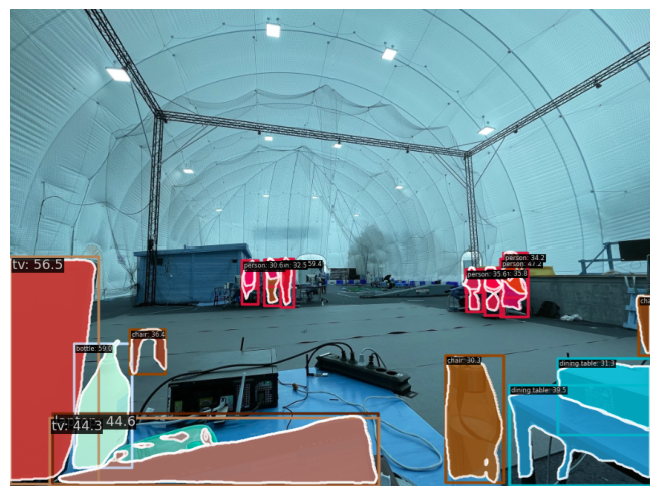

In [2]:
# test a single image and show the results
image = mmcv.imread('img.png')  
# or img = mmcv.imread(img), which will only load it once
result = inference_detector(model, image)

# init the visualizer(execute this block only once)
visualizer = VISUALIZERS.build(model.cfg.visualizer)
# the dataset_meta is loaded from the checkpoint and
# then pass to the model in init_detector
visualizer.dataset_meta = model.dataset_meta

# show the results
visualizer.add_datasample(
    'result',
    image,
    data_sample=result,
    draw_gt=False,
    wait_time=0,
    out_file='outputs/result_test_s.png' # optionally, write to output file
)
visualizer.show()

In [5]:
import pyrealsense2 as rs
import numpy as np
import mmcv
import cv2
# Configure depth and color streams
pipeline = rs.pipeline()

pipeline.start()

# Wait for a coherent pair of frames: depth and color
frames = pipeline.wait_for_frames()
depth_frame = frames.get_depth_frame()
color_frame = frames.get_color_frame()


In [2]:
import pyrealsense2 as rs
import numpy as np
import mmcv
import cv2
# Configure depth and color streams
pipeline = rs.pipeline()

pipeline.start()

# Wait for a coherent pair of frames: depth and color
frames = pipeline.wait_for_frames()
depth_frame = frames.get_depth_frame()
color_frame = frames.get_color_frame()
points = pc.calculate(depth_frame)

# Convert images to numpy arrays
depth_image = np.asanyarray(depth_frame.get_data())
color_image = np.asanyarray(color_frame.get_data())

# Apply colormap on depth image (image must be converted to 8-bit per pixel first)
depth_colormap = cv2.applyColorMap(cv2.convertScaleAbs(depth_image, alpha=0.03), cv2.COLORMAP_JET)

depth_colormap_dim = depth_colormap.shape
color_colormap_dim = color_image.shape
cv2.namedWindow('RealSense', cv2.WINDOW_AUTOSIZE)
cv2.imshow('xuyaozhge',mmcv.imread(color_image))
pipeline.stop()

QObject::moveToThread: Current thread (0x791d1d0) is not the object's thread (0x7bc2b30).
Cannot move to target thread (0x791d1d0)

QObject::moveToThread: Current thread (0x791d1d0) is not the object's thread (0x7bc2b30).
Cannot move to target thread (0x791d1d0)

QObject::moveToThread: Current thread (0x791d1d0) is not the object's thread (0x7bc2b30).
Cannot move to target thread (0x791d1d0)

QObject::moveToThread: Current thread (0x791d1d0) is not the object's thread (0x7bc2b30).
Cannot move to target thread (0x791d1d0)

QObject::moveToThread: Current thread (0x791d1d0) is not the object's thread (0x7bc2b30).
Cannot move to target thread (0x791d1d0)

QObject::moveToThread: Current thread (0x791d1d0) is not the object's thread (0x7bc2b30).
Cannot move to target thread (0x791d1d0)

QObject::moveToThread: Current thread (0x791d1d0) is not the object's thread (0x7bc2b30).
Cannot move to target thread (0x791d1d0)

QObject::moveToThread: Current thread (0x791d1d0) is not the object's thread

# Real-time semantic mapping

In [9]:
import torch, torchvision
import mmdet
from mmdet.apis import init_detector,inference_detector
from mmdet.registry import VISUALIZERS
import mmcv
from mmcv.ops import get_compiling_cuda_version, get_compiler_version
from matplotlib import pyplot as plt

import pyrealsense2 as rs
import numpy as np
import cv2

import open3d as o3d

print('torch.__version__ and CUDA: ',torch.__version__, torch.cuda.is_available())
print('mmdet.__version__: ',mmdet.__version__)
print('get_compiling_cuda_version: ',get_compiling_cuda_version())
print('get_compiler_version: ',get_compiler_version())

# Choose to use a config and initialize the detector
config = '/home/haoran/mmdetection/configs/rtmdet/rtmdet-ins_tiny_8xb32-300e_coco.py'
#config = 'rtmdet-ins_s_8xb32-300e_coco.py'

# Setup a checkpoint file to load
checkpoint = 'pre_trained_models/rtmdet-ins_tiny_8xb32-300e_coco_20221130_151727-ec670f7e.pth'
#checkpoint = 'pre_trained_models/rtmdet-ins_s_8xb32-300e_coco_20221121_212604-fdc5d7ec.pth'

# Load pretrained model
model = init_detector(config,checkpoint=checkpoint, device='cuda:0')

#print('model info:'model)
## License: Apache 2.0. See LICENSE file in root directory.
## Copyright(c) 2015-2017 Intel Corporation. All Rights Reserved.

###############################################
##      Open CV and Numpy integration        ##
###############################################


# Configure depth and color streams
pipeline = rs.pipeline()
config = rs.config()

# Get device product line for setting a supporting resolution
pipeline_wrapper = rs.pipeline_wrapper(pipeline)
pipeline_profile = config.resolve(pipeline_wrapper)
device = pipeline_profile.get_device()
device_product_line = str(device.get_info(rs.camera_info.product_line))

found_rgb = False
for s in device.sensors:
    if s.get_info(rs.camera_info.name) == 'RGB Camera':
        found_rgb = True
        break
if not found_rgb:
    print("The demo requires Depth camera with Color sensor")
    exit(0)

config.enable_stream(rs.stream.depth, 640, 480, rs.format.z16, 30)
config.enable_stream(rs.stream.color, 640, 480, rs.format.bgr8, 30)

# Start streaming
pipeline.start(config)

# Create an Open3D window for real-time visualization
vis = o3d.visualization.Visualizer()
vis.create_window('RealSense Point Cloud', width=640, height=480)
# Generate 80 distinct colors
def colors_generator(n_labels):
    # Set a fixed seed for the random number generator
    np.random.seed(42)  
    # Create an array of 80 distinct colors
    colors = []
    for i in range(num_labels):
        color = np.random.randint(0, 256, size=3, dtype=np.uint8)    
        while any(np.array_equal(color, c) for c in colors):
            color = np.random.randint(0, 256, size=3, dtype=np.uint8)
        colors.append(color)
    colors = np.array(colors)
    return colors
num_labels = 80
colors = colors_generator(num_labels)
label_to_color = {label: colors[label] for label in range(num_labels)}

#try:
#    while True:

# Wait for a coherent pair of frames: depth and color
frames = pipeline.wait_for_frames()
depth_frame = frames.get_depth_frame()
color_frame = frames.get_color_frame()
#if not depth_frame or not color_frame:
    #continue

# Convert images to numpy arrays
depth_image = np.asanyarray(depth_frame.get_data())
color_image = np.asanyarray(color_frame.get_data())

# or img = mmcv.imread(img), which will only load it once
result = inference_detector(model, color_image)

# Access the predicted instances data
pred_instances = result.pred_instances

# Extract the masks and bounding boxes from pred_instances
masks = pred_instances.masks.cpu().numpy()
bboxes = pred_instances.bboxes.cpu().numpy()
labels = pred_instances.labels.cpu().numpy()
original_image = np.zeros_like(color_image)

colored_masks = []  # List to store colored masks

for mask, label in zip(masks, labels):
    color = label_to_color.get(label, (0, 0, 0))  # Default to black if label is not found
    colored_mask = np.zeros((mask.shape[0], mask.shape[1], 3), dtype=np.uint8)
    colored_mask[mask > 0] = color
    colored_masks.append(colored_mask)

# Iterate through each mask and bounding box
for mask,colored_mask in zip(masks,colored_masks):

    original_image[mask > 0] = colored_mask[mask > 0]
    
rgbd_image = o3d.geometry.RGBDImage.create_from_color_and_depth(o3d.geometry.Image(color_image), o3d.geometry.Image(depth_image), convert_rgb_to_intensity=False)
#rgbd_image = o3d.geometry.create_rgbd_image_from_color_and_depth(color_image, depth_image)
#rgbd_image = o3d.geometry.RGBDImage.create_from_color_and_depth(
#    o3d.geometry.Image(original_image), o3d.geometry.Image(depth_image), convert_rgb_to_intensity=False)
depth_scale = pipeline.get_active_profile().get_device().first_depth_sensor().get_depth_scale()
depth_intrin = depth_frame.profile.as_video_stream_profile().intrinsics
pc = rs.pointcloud()
points = pc.calculate(depth_frame)


# Create Open3D point cloud
pcd = o3d.geometry.PointCloud.create_from_rgbd_image(
        rgbd_image,
        o3d.camera.PinholeCameraIntrinsic(
            o3d.camera.PinholeCameraIntrinsicParameters.PrimeSenseDefault))
# Visualize the point cloud
#vis.add_geometry(pcd)
#vis.update_geometry(pcd)
#vis.poll_events()
#vis.update_renderer()
#downpcd = pcd.voxel_down_sample(voxel_size=0.05)
o3d.visualization.draw_geometries([pcd])
#    except KeyboardInterrupt:
#        pass


# Stop streaming
pipeline.stop()

# Close the Open3D window
#vis.destroy_window()

torch.__version__ and CUDA:  2.1.0 True
mmdet.__version__:  3.1.0
get_compiling_cuda_version:  12.2
get_compiler_version:  GCC 11.4
Loads checkpoint by local backend from path: pre_trained_models/rtmdet-ins_tiny_8xb32-300e_coco_20221130_151727-ec670f7e.pth


# Real-time instance segmentation and visualization

In [1]:
import torch, torchvision
import mmdet
from mmdet.apis import init_detector,inference_detector
from mmdet.registry import VISUALIZERS
import mmcv
from mmcv.ops import get_compiling_cuda_version, get_compiler_version
from matplotlib import pyplot as plt

import pyrealsense2 as rs
import numpy as np
import cv2


print('torch.__version__ and CUDA: ',torch.__version__, torch.cuda.is_available())
print('mmdet.__version__: ',mmdet.__version__)
print('get_compiling_cuda_version: ',get_compiling_cuda_version())
print('get_compiler_version: ',get_compiler_version())

# Choose to use a config and initialize the detector
config = '/home/haoran/mmdetection/configs/rtmdet/rtmdet-ins_tiny_8xb32-300e_coco.py'
#config = 'rtmdet-ins_s_8xb32-300e_coco.py'

# Setup a checkpoint file to load
checkpoint = 'pre_trained_models/rtmdet-ins_tiny_8xb32-300e_coco_20221130_151727-ec670f7e.pth'
#checkpoint = 'pre_trained_models/rtmdet-ins_s_8xb32-300e_coco_20221121_212604-fdc5d7ec.pth'

# Load pretrained model
model = init_detector(config,checkpoint=checkpoint, device='cuda:0')

#print('model info:'model)
## License: Apache 2.0. See LICENSE file in root directory.
## Copyright(c) 2015-2017 Intel Corporation. All Rights Reserved.

###############################################
##      Open CV and Numpy integration        ##
###############################################


# Configure depth and color streams
pipeline = rs.pipeline()
config = rs.config()

# Get device product line for setting a supporting resolution
pipeline_wrapper = rs.pipeline_wrapper(pipeline)
pipeline_profile = config.resolve(pipeline_wrapper)
device = pipeline_profile.get_device()
device_product_line = str(device.get_info(rs.camera_info.product_line))

found_rgb = False
for s in device.sensors:
    if s.get_info(rs.camera_info.name) == 'RGB Camera':
        found_rgb = True
        break
if not found_rgb:
    print("The demo requires Depth camera with Color sensor")
    exit(0)

config.enable_stream(rs.stream.depth, 640, 480, rs.format.z16, 30)
config.enable_stream(rs.stream.color, 640, 480, rs.format.bgr8, 30)

# Start streaming
pipeline.start(config)

try:
    while True:

        # Wait for a coherent pair of frames: depth and color
        frames = pipeline.wait_for_frames()
        depth_frame = frames.get_depth_frame()
        color_frame = frames.get_color_frame()
        points = pc.calculate(depth_frame)
        if not depth_frame or not color_frame:
            continue

        # Convert images to numpy arrays
        depth_image = np.asanyarray(depth_frame.get_data())
        color_image = np.asanyarray(color_frame.get_data())
        
        # Apply colormap on depth image (image must be converted to 8-bit per pixel first)
        depth_colormap = cv2.applyColorMap(cv2.convertScaleAbs(depth_image, alpha=0.03), cv2.COLORMAP_JET)

        depth_colormap_dim = depth_colormap.shape
        color_colormap_dim = color_image.shape

        # If depth and color resolutions are different, resize color image to match depth image for display
        if depth_colormap_dim != color_colormap_dim:
            resized_color_image = cv2.resize(color_image, dsize=(depth_colormap_dim[1], depth_colormap_dim[0]), interpolation=cv2.INTER_AREA)
            images = np.hstack((resized_color_image, depth_colormap))
        else:
            images = np.hstack((color_image, depth_colormap))
        # test a single image and show the results
        image = mmcv.imread(color_image)  
        # or img = mmcv.imread(img), which will only load it once
        result = inference_detector(model, image)

        # init the visualizer(execute this block only once)
        visualizer = VISUALIZERS.build(model.cfg.visualizer)
        # the dataset_meta is loaded from the checkpoint and
        # then pass to the model in init_detector
        visualizer.dataset_meta = model.dataset_meta

        # show the results
        visualizer.add_datasample(
            'result',
            image,
            data_sample=result,
            draw_gt=False,
            wait_time=0,
            out_file='outputs/result_test_RT.png' # optionally, write to output file
        )
        #visualizer.show()
        # Show images
        cv2.namedWindow('RealSense', cv2.WINDOW_AUTOSIZE)
        
        cv2.imshow('RealSense', cv2.imread('outputs/result_test_RT.png'))
        cv2.waitKey(1)

finally:

    # Stop streaming
    pipeline.stop()
    

torch.__version__ and CUDA:  2.1.0 True
mmdet.__version__:  3.1.0
get_compiling_cuda_version:  12.2
get_compiler_version:  GCC 11.4
Loads checkpoint by local backend from path: pre_trained_models/rtmdet-ins_tiny_8xb32-300e_coco_20221130_151727-ec670f7e.pth


/home/haoran/miniconda3/envs/openmmlab/lib/python3.8/site-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at /opt/conda/conda-bld/pytorch_1695392036766/work/aten/src/ATen/native/TensorShape.cpp:3526.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
/home/haoran/miniconda3/envs/openmmlab/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:196: UserWarning: Failed to add <class 'mmengine.visualization.vis_backend.LocalVisBackend'>, please provide the `save_dir` argument.
  warnings.warn(f'Failed to add {vis_backend.__class__}, '
/home/haoran/miniconda3/envs/openmmlab/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(
/home/haoran/miniconda3/envs/openmmlab/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:8

QObject::moveToThread: Current thread (0x974bd10) is not the object's thread (0x13b7fb70).
Cannot move to target thread (0x974bd10)

QObject::moveToThread: Current thread (0x974bd10) is not the object's thread (0x13b7fb70).
Cannot move to target thread (0x974bd10)

QObject::moveToThread: Current thread (0x974bd10) is not the object's thread (0x13b7fb70).
Cannot move to target thread (0x974bd10)

QObject::moveToThread: Current thread (0x974bd10) is not the object's thread (0x13b7fb70).
Cannot move to target thread (0x974bd10)

QObject::moveToThread: Current thread (0x974bd10) is not the object's thread (0x13b7fb70).
Cannot move to target thread (0x974bd10)

QObject::moveToThread: Current thread (0x974bd10) is not the object's thread (0x13b7fb70).
Cannot move to target thread (0x974bd10)

QObject::moveToThread: Current thread (0x974bd10) is not the object's thread (0x13b7fb70).
Cannot move to target thread (0x974bd10)

QObject::moveToThread: Current thread (0x974bd10) is not the object's

KeyboardInterrupt: 

In [1]:
# First import the library
import pyrealsense2 as rs

# Create a context object. This object owns the handles to all connected realsense devices
pipeline = rs.pipeline()
pipeline.start()

try:
    while True:
        # Create a pipeline object. This object configures the streaming camera and owns it's handle
        frames = pipeline.wait_for_frames()
        depth = frames.get_depth_frame()
        if not depth: continue

        # Print a simple text-based representation of the image, by breaking it into 10x20 pixel regions and approximating the coverage of pixels within one meter
        coverage = [0]*64
        for y in range(480):
            for x in range(640):
                dist = depth.get_distance(x, y)
                if 0 < dist and dist < 1:
                    coverage[x//10] += 1

            if y%20 is 19:
                line = ""
                for c in coverage:
                    line += " .:nhBXWW"[c//25]
                coverage = [0]*64
                print(line)

finally:
    pipeline.stop()

<>:23: SyntaxWarning: "is" with a literal. Did you mean "=="?
<>:23: SyntaxWarning: "is" with a literal. Did you mean "=="?
/tmp/ipykernel_16155/2375369952.py:23: SyntaxWarning: "is" with a literal. Did you mean "=="?
  if y%20 is 19:


                                                                
                                                                
                                                                
                                                                
                                                                
                                                                
                                                                
                                                                
                                                                
                                                                
                                                                
                                                                
            ....                                                
             hXWWBhn:                                           
            .nXWWWXXXWB:                                        
                     nXWB

                       . B:                                     
         :             :  Xh                                    
                          hn                                    
                           :.                                   
                             :.                                 
                           : :.                                 
                              .nn                               
                                h                               
                                                                
                                                                
                                                                
                                                                
                                                                
                                                                
                                                                
                         

            :BWBBhnn                                            
             :hXWWXWWXh.                                        
                     .BWB.                                      
                       ..B.                                     
         n             .  Bh                                    
                          nB.                                   
                           :                                    
                            nn:                                 
           :                 ..:                                
                              .:n                               
     .                          n.                              
                                                                
                                                                
                                                                
                                                                
                         

            :BXXBBnn                                            
             nhXWWXBXBh.                                        
                      hWB.                                      
                       ..h:                                     
         :             .  hh                                    
                          nB:                                   
                           :.:                                  
       .                    .n.                                 
          ..               . . .                                
                              .nn                               
                                h                               
                                                                
                                                                
                                                                
                                                                
                         

                                                                
                                                                
                                                                
                                                                
                                                                
                                                                
                                                                
                                                                
                                                                
                                                                
                                                                
                                                                
            .BXXBBnn                                            
             :hWWWXXWXh.                                        
                      hWh                                       
                       . 

                                                                
                                                                
                                                                
                                                                
                                                                
                                                                
                                                                
                                                                
                                                                
            :BXXBhnn                                            
             :hWWWXXWXh.                                        
                     .BWh                                       
                       ..B:                                     
                          Xn                                    
                          nB.                                   
                         

                          nB:                                   
                           n..                                  
                            .h.                                 
           .                  :                                 
                               .h                               
                                n.                              
                                                                
                                                                
                                                                
                                                                
                                                                
                                                                
                                                                
                                                                
                                                                
                         

                                                                
                                                                
                                                                
                                                                
                                                                
                                                                
                                                                
                                                                
                                                                
            .BXXBh::                                            
            .:hWWWXXWXh.                                        
                     .BWB.                                      
                        .h.                                     
         .                Xn                                    
                          nB.                                   
                         

                                                                
                                                                
                                                                
                                                                
                                                                
                                                                
                                                                
                                                                
                                                                
                                                                
             ..                                                 
             BXXBhnn                                            
             .hXWWXXXXB:                                        
      .               BWB                                       
                        .h:                                     
                         

                         .Bh                                    
                          :X.                                   
                           nn                                   
                            .h                                  
                           . :                                  
                               .h                               
                                h                               
                                                                
                                                                
                                                                
                                                                
                                                                
                                                                
                                                                
                                                                
                         

                .   ..hWB                                       
                        .hn                                     
                          Bn                                    
                          :X.                                   
        .                  :n.                                  
                            :h.                                 
                           . :                                  
                               .n                               
     .    ..                    h                               
                                                                
                                                                
                                                                
                                                                
                                                                
                                                                
                         

             .                                                  
            :XWBBhnn                                            
            .:hXWWXXXXB.                                        
                      hWB                                       
                       ..nn                                     
                          Bn                                    
                          :X:                                   
       ..                  :..                                  
                            :n                                  
                           . ..                                 
                               nn                               
                                n                               
                                                                
                                                                
                                                                
                         

                       . hn                                     
                          hn                                    
                          :B                                    
          .      n.        :n                                   
                            .h:                                 
                           : .                                  
                               :n                               
           :                    :                               
                                                                
                                                                
                                                                
                                                                
                                                                
                                                                
                                                                
                         

                            .n                                  
                           .                                    
                                n                               
           :                    h                               
                                                                
                                                                
                                                                
                                                                
                                                                
                                                                
                                                                
                                                                
                                                                
                                                                
                                                                
                         

                       . :n                                     
                          B:                                    
                          .X:                                   
        .        ..        :::                                  
                            .h.                                 
           .               .                                    
                               .h                               
               .                h                               
                                                                
                                                                
                                                                
                                                                
                                                                
                                                                
                                                                
                         

                 .         :::                                  
                             n.                                 
                              .                                 
                                h                               
           :                    h                               
                                                                
                                                                
                                                                
                                                                
                                                                
                                                                
                                                                
                                                                
                                                                
                                                                
                         

       .                       .n                               
           :                    n                               
                                                                
                                                                
                                                                
                                                                
                                                                
                                                                
                                                                
                                                                
                                                                
                                                                
                                                                
                                                                
                                                                
            :XXBBh::     

                                h                               
                                                                
                                                                
                                                                
                                                                
                                                                
                                                                
                                                                
                                                                
                                                                
                                                                
                                                                
                                                                
            ...                                                 
            .XXXXBnn.                                           
            .:BWWWWXWWX: 

                                                                
                                                                
                                                                
                                                                
                                                                
             .                                                  
            .XXBXBn:.                                           
            .nBWXWWWWXB:                                        
                :.  ..BWX.                                      
       .               :.hn                                     
                          B:                                    
                          .X.                                   
          .      .         nh.                                  
                            .h                                  
                           . :                                  
                         

                                                                
                                                                
                                                                
                                                                
                                                                
            ..                                                  
            :XXBXh::                                            
            .nBWXWWWWXB:                                        
                ..  ..BWX.                                      
                       . hn                                     
                          B:                                    
                          .B.                                   
        .                  . n                                  
                            .h.                                 
                           . .                                  
                         

                                                                
                                                                
            ..                                                  
            :XXBXhn:                                            
             nBWWWWWWXB:                                        
                ..   .BXX.                                      
                        .hn                                     
                          Bn                                    
                          .h:                                   
                 :.        :.                                   
                            .h                                  
                           .                                    
                                :                               
                                h                               
                                                                
                         

                                                                
                                                                
                                                                
                                                                
                                                                
                                                                
                                                                
                                                                
                                                                
                                                                
                                                                
            .XWBBhn:                                            
            .nBXWWWWWXh.                                        
                .:  .:BWX.                                      
                       :.hh                                     
                         

           :                    n                               
                                                                
                                                                
                                                                
                                                                
                                                                
                                                                
                                                                
                                                                
                                                                
                                                                
                                                                
                                                                
            ..                                                  
            nXXBXhn:                                            
            .nXWXWWWWXB: 

                          hn                                    
                          .X:                                   
                           :.:                                  
                            :n                                  
          .:                 . .                                
                               ::                               
           :                    n                               
                                                                
                                                                
                                                                
                                                                
                                                                
                                                                
                                                                
                                                                
                         

                                                                
                              :.n                               
           .                    :                               
                                                                
                                                                
                                                                
                                                                
                                                                
                                                                
                                                                
                                                                
                                                                
                                                                
                                                                
                                                                
             .           

          ::              .: .                                  
              .                .h                               
                                h                               
                                                                
                                                                
                                                                
                                                                
                                                                
                                                                
                                                                
                                                                
                                                                
                                                                
                                                                
                                                                
            ..           

                          Bh                                    
                           X.                                   
                 n. .      :h.                                  
                             hn                                 
           .                                                    
                               .n                               
           .                    :                               
                                                                
                                                                
                                                                
                                                                
                                                                
                                                                
                                                                
                                                                
                         

              .           .Xh                                   
        :        .         :n.                                  
                            .h:                                 
          ::                   :                                
                               :n                               
           .                    n                               
                                                                
                                                                
                                                                
                                                                
                                                                
                                                                
                                                                
                                                                
                                                                
                         

/tmp/ipykernel_16155/2375369952.py:23: SyntaxWarning: "is" with a literal. Did you mean "=="?
  if y%20 is 19:
/tmp/ipykernel_16155/2375369952.py:23: SyntaxWarning: "is" with a literal. Did you mean "=="?
  if y%20 is 19:


KeyboardInterrupt: 